<h1><center><span style="color:Living Coral">Lending Club Case Study</span></center></h1>

# Problem Statement

The company wants to understand the driving factors (or driver variables) behind loan default, i.e. the variables which are strong indicators of default.  The company can utilise this knowledge for its portfolio and risk assessment. 

If the company approves the loan, there are 3 possible scenarios described below:

* Fully paid: Applicant has fully paid the loan (the principal and the interest rate)

* Current: Applicant is in the process of paying the instalments, i.e. the tenure of the loan is not yet completed. These candidates are not labelled as 'defaulted'.

* Charged-off: Applicant has not paid the instalments in due time for a long period of time, i.e. he/she has defaulted on the loan 

In [4]:
# Libraries Imports
from __future__ import print_function, division
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from scipy.stats import chi2_contingency
from IPython.display import Markdown
%matplotlib inline
sns.set(style="whitegrid")

In [5]:
# Please install the latest plotly version , as some of plots depends upon it . Uncomment the below line to install it
# !pip install plotly==4.8.1

# Data Sourcing

### Load the Loan Dataset from loan.csv Sheet

In [6]:
# encoding used here is 'ISO-8859-1'  
df = pd.read_csv("loan.csv",encoding='ISO-8859-1',low_memory=False)

## About Loan Dataset

<img src="https://cdn.upgrad.com/UpGrad/temp/7afbce98-8ecc-41c6-96d8-981cba7d343f/Loan_image.png" style="height:30rem;"/>

We are analyzing just the Dataset containing when the loan was accepted and which were fully paid and defaulted

In [7]:
# Lets print the first few rows to check the dataset
df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


In [8]:
# Check the types
df.dtypes

id                              int64
member_id                       int64
loan_amnt                       int64
funded_amnt                     int64
funded_amnt_inv               float64
                               ...   
tax_liens                     float64
tot_hi_cred_lim               float64
total_bal_ex_mort             float64
total_bc_limit                float64
total_il_high_credit_limit    float64
Length: 111, dtype: object

In [9]:
# Shape of Dataset - rows, columns
df.shape

(39717, 111)

# Data Cleaning

### Check number of null values in each column

In [10]:
# print fraction of null values
df.isnull().sum()/df.shape[0]

id                            0.000000
member_id                     0.000000
loan_amnt                     0.000000
funded_amnt                   0.000000
funded_amnt_inv               0.000000
                                ...   
tax_liens                     0.000982
tot_hi_cred_lim               1.000000
total_bal_ex_mort             1.000000
total_bc_limit                1.000000
total_il_high_credit_limit    1.000000
Length: 111, dtype: float64

In [11]:
# check number of columns where whole column has Null Values 
(df.isnull().sum()/df.shape[0]==1).sum()

54

We see that 54 columns(examples below) are fully empty, hence lets remove it. 
* tot_hi_cred_lim
* total_bal_ex_mort
* total_bc_limit
* total_il_high_credit_limit

In [12]:
# Remove columns when 'all' of its rows are empty
df = df.dropna(how='all', axis=1)

### Unique values in columns 

In [13]:
df.nunique()

id                            39717
member_id                     39717
loan_amnt                       885
funded_amnt                    1041
funded_amnt_inv                8205
term                              2
int_rate                        371
installment                   15383
grade                             7
sub_grade                        35
emp_title                     28820
emp_length                       11
home_ownership                    5
annual_inc                     5318
verification_status               3
issue_d                          55
loan_status                       3
pymnt_plan                        1
url                           39717
desc                          26527
purpose                          14
title                         19615
zip_code                        823
addr_state                       50
dti                            2868
delinq_2yrs                      11
earliest_cr_line                526
inq_last_6mths              

In [14]:
# Get columns where all values are same 
df.nunique()[df.nunique(dropna=False)==1]

pymnt_plan             1
initial_list_status    1
policy_code            1
application_type       1
acc_now_delinq         1
delinq_amnt            1
dtype: int64

### Since these variables is not helpfull since there is no variation and not related to other variables in dataset, Lets remove it

In [15]:
df = df.drop(df.nunique()[df.nunique()==1].index.to_list(),axis=1)
df.head(2)

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,pub_rec_bankruptcies
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,5000.00,863.16,0.0,0.00,0.00,Jan-15,171.62,NaN,May-16,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,456.46,435.17,0.0,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0


In [16]:
# Lets check the shape of dataset again
df.shape

(39717, 48)

### We are left with 48 variables to analyze

In [17]:
# print Null Values percent again
df.isnull().sum()[df.isnull().sum()/df.shape[0]>0]/df.shape[0]*100

emp_title                  6.191303
emp_length                 2.706650
desc                      32.580507
title                      0.027696
mths_since_last_delinq    64.662487
mths_since_last_record    92.985372
revol_util                 0.125891
last_pymnt_d               0.178765
next_pymnt_d              97.129693
last_credit_pull_d         0.005036
pub_rec_bankruptcies       1.754916
dtype: float64

### Check Null values in last payment date, last credit pull date, revolution utilization , pub_rec_bankruptcies, emp_length

In [18]:
# change to display to all columns
pd.set_option('display.max_columns', 500)
df[df.last_pymnt_d.isnull() | df.last_credit_pull_d.isnull() | df.revol_util.isnull() | df.pub_rec_bankruptcies.isnull() | df.emp_length.isnull()].head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,pub_rec_bankruptcies
26,1069800,1304679,15000,15000,8725.0,36 months,14.27%,514.64,C,C2,nyc transit,9 years,RENT,60000.0,Not Verified,Dec-11,Charged Off,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/15/11 > looking to cons...,debt_consolidation,consolidation,103xx,NY,15.22,0,Oct-03,1,NaN,NaN,7,0,5872,57.60%,11,0.0,0.0,0.00000,0.00,0.00,0.00,0.0,0.00,0.0000,NaN,0.00,NaN,May-16,0.0
168,1067644,1302032,2500,2500,2500.0,36 months,7.51%,77.78,A,A3,NaN,NaN,OWN,12000.0,Source Verified,Dec-11,Charged Off,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/13/11 > TO CONSOLIDATE ...,debt_consolidation,GET FREE OF DEBT,961xx,CA,16.30,0,Aug-94,2,NaN,NaN,13,0,4853,42.20%,20,0.0,0.0,1838.88000,1838.88,1575.06,253.74,0.0,10.08,0.0000,Dec-13,77.78,NaN,May-16,0.0
323,1058717,1290516,18000,18000,18000.0,60 months,17.58%,452.98,D,D4,NaN,NaN,MORTGAGE,60000.0,Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/12/11 > I plan to pay o...,debt_consolidation,consolidation,363xx,AL,21.96,0,Mar-03,1,75.0,NaN,11,0,5945,83.70%,28,0.0,0.0,26378.55001,26378.55,18000.00,8378.55,0.0,0.00,0.0000,Sep-15,6909.59,NaN,Sep-15,0.0
394,1064582,1298394,4000,4000,4000.0,36 months,11.71%,132.31,B,B3,NaN,NaN,RENT,24000.0,Source Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/10/11 > fix steps on po...,home_improvement,Reline pool and fix steeps,328xx,FL,7.50,1,Feb-05,0,16.0,NaN,4,0,1593,54.90%,6,0.0,0.0,4186.02303,4186.02,4000.00,186.02,0.0,0.00,0.0000,May-12,3658.15,NaN,May-12,0.0
422,1064366,1298164,1000,1000,1000.0,36 months,14.65%,34.50,C,C3,NaN,NaN,RENT,18408.0,Not Verified,Dec-11,Charged Off,https://lendingclub.com/browse/loanDetail.acti...,NaN,major_purchase,Myloan,080xx,NJ,6.00,0,Apr-93,2,NaN,114.0,3,1,2510,83.70%,8,0.0,0.0,91.31000,91.31,22.24,12.18,0.0,56.89,10.2402,Jan-12,34.50,NaN,Jun-12,1.0


In [19]:
# Drop the not usefull columns
df = df.drop(columns=['last_pymnt_d','last_credit_pull_d','revol_util','pub_rec_bankruptcies'],axis=1)

### Remove null values in emp_length and title 

In [20]:
# check for null value in each of the column and remove
df = df[~(df.title.isnull() | df.emp_length.isnull())]

In [21]:
# print Null Values percent again
df.isnull().sum()[df.isnull().sum()/df.shape[0]*100>0]/df.shape[0]*100

emp_title                  3.724891
desc                      32.330710
mths_since_last_delinq    64.570822
mths_since_last_record    93.106751
next_pymnt_d              97.157797
dtype: float64

### Remove mths_since_last_delinq,mths_since_last_record,next_pymnt_d 
Since most of values are missing in these columns, we can remove it so that dataset looks clean

In [22]:
# Drop columns 
df = df.drop(labels=['mths_since_last_delinq','mths_since_last_record','next_pymnt_d'],axis=1)

In [23]:
# print Null Values percent again
df.isnull().sum()[df.isnull().sum()/df.shape[0]>0]/df.shape[0]*100

emp_title     3.724891
desc         32.330710
dtype: float64

#### Since the above columns are not that related to defaulting, lets keep it as it is 

### Final List of variables to analyse

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38632 entries, 0 to 39716
Data columns (total 41 columns):
id                         38632 non-null int64
member_id                  38632 non-null int64
loan_amnt                  38632 non-null int64
funded_amnt                38632 non-null int64
funded_amnt_inv            38632 non-null float64
term                       38632 non-null object
int_rate                   38632 non-null object
installment                38632 non-null float64
grade                      38632 non-null object
sub_grade                  38632 non-null object
emp_title                  37193 non-null object
emp_length                 38632 non-null object
home_ownership             38632 non-null object
annual_inc                 38632 non-null float64
verification_status        38632 non-null object
issue_d                    38632 non-null object
loan_status                38632 non-null object
url                        38632 non-null object
desc      

### So we have finally 45 variables to analyse 

In [25]:
# Analyzing Annual Income column
pd.set_option('display.float_format', lambda x: '%.2f' % x)
df.annual_inc.describe()    

count     38632.00
mean      69612.79
std       64259.94
min        4000.00
25%       41400.00
50%       60000.00
75%       83200.00
max     6000000.00
Name: annual_inc, dtype: float64

## Outliers Analysis on Annual Income

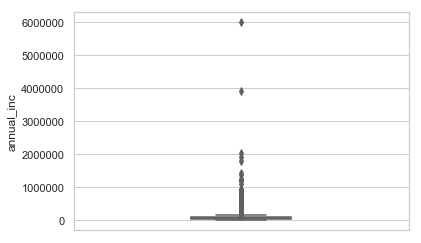

In [26]:
# To check the outliers, lets draw box plot
sns.boxplot(y=df["annual_inc"], width=0.3, palette="Blues")
plt.show()

In [27]:
# Remove outliers remove values beyond 99 quantile.
q99 = df["annual_inc"].quantile(0.99)
q99

235000.0

In [28]:
# Remove 99th percentile values
df = df[df["annual_inc"] < q99]
df.annual_inc.describe()

count    38239.00
mean     66116.88
std      35201.44
min       4000.00
25%      41000.00
50%      59600.00
75%      82000.00
max     234996.00
Name: annual_inc, dtype: float64

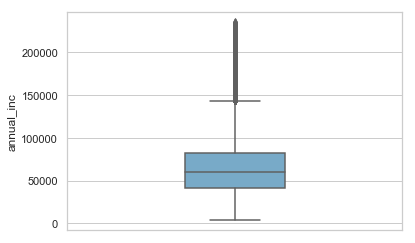

In [29]:
# To check the outliers draw box plot
sns.boxplot(y=df["annual_inc"], width=0.3, palette="Blues")
plt.show()

# Understanding Dataset Variables

## Categorical Variable

### String/Object type variables

In [30]:
# print columns which are type object
df.dtypes[df.dtypes==object]

term                   object
int_rate               object
grade                  object
sub_grade              object
emp_title              object
emp_length             object
home_ownership         object
verification_status    object
issue_d                object
loan_status            object
url                    object
desc                   object
purpose                object
title                  object
zip_code               object
addr_state             object
earliest_cr_line       object
dtype: object

### Check the first records of object types column

In [31]:
# Filter by object types variables
df[df.dtypes[df.dtypes==object].index.to_list()].head()

,term,int_rate,grade,sub_grade,emp_title,emp_length,home_ownership,verification_status,issue_d,loan_status,url,desc,purpose,title,zip_code,addr_state,earliest_cr_line
0,36 months,10.65%,B,B2,NaN,10+ years,RENT,Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,Jan-85
1,60 months,15.27%,C,C4,Ryder,< 1 year,RENT,Source Verified,Dec-11,Charged Off,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,Apr-99
2,36 months,15.96%,C,C5,NaN,10+ years,RENT,Not Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,Nov-01
3,36 months,13.49%,C,C1,AIR RESOURCES BOARD,10+ years,RENT,Source Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,Feb-96
4,60 months,12.69%,B,B5,University Medical Group,1 year,RENT,Source Verified,Dec-11,Current,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > I plan on combi...,other,Personal,972xx,OR,Jan-96


### Useful String Categorical Variables
* term
* grade
* sub_grade
* emp_length
* home_ownership
* verification_status
* loan_status
* purpose
* title (Although many, We can keep the top 20-30 categories )
* addr_state

### Useful Date Variables
* issue_d
* last_pymnt_d
* last_credit_pull_d
* earliest_cr_line

### Usefull Numeric Variables
* int_rate,
* revol_util 

### Converting Interest rate to Numeric

In [32]:
df.int_rate = df.int_rate.apply(lambda x : float(x[:-1]))

### Splitting Issue_d into year and month 

In [33]:
df['issue_month'],df['issue_year'] = df['issue_d'].str.split('-', 1).str

In [34]:
## Change order of months from Jan to Dec, currently it's in alphabetical order(A-Z)
months_order = ["Jan", "Feb", "Mar", "Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"]
df['issue_month'] = pd.Categorical(df['issue_month'],categories=months_order, ordered=True)
df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,issue_month,issue_year
0,1077501,1296599,5000,5000,4975.00,36 months,10.65,162.87,B,B2,NaN,10+ years,RENT,24000.00,Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,3,0,13648,9,0.00,0.00,5863.16,5833.84,5000.00,863.16,0.00,0.00,0.00,171.62,Dec,11
1,1077430,1314167,2500,2500,2500.00,60 months,15.27,59.83,C,C4,Ryder,< 1 year,RENT,30000.00,Source Verified,Dec-11,Charged Off,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0,Apr-99,5,3,0,1687,4,0.00,0.00,1008.71,1008.71,456.46,435.17,0.00,117.08,1.11,119.66,Dec,11
2,1077175,1313524,2400,2400,2400.00,36 months,15.96,84.33,C,C5,NaN,10+ years,RENT,12252.00,Not Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,2,0,2956,10,0.00,0.00,3005.67,3005.67,2400.00,605.67,0.00,0.00,0.00,649.91,Dec,11
3,1076863,1277178,10000,10000,10000.00,36 months,13.49,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.00,Source Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0,Feb-96,1,10,0,5598,37,0.00,0.00,12231.89,12231.89,10000.00,2214.92,16.97,0.00,0.00,357.48,Dec,11
4,1075358,1311748,3000,3000,3000.00,60 months,12.69,67.79,B,B5,University Medical Group,1 year,RENT,80000.00,Source Verified,Dec-11,Current,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > I plan on combi...,other,Personal,972xx,OR,17.94,0,Jan-96,0,15,0,27783,38,524.06,524.06,3513.33,3513.33,2475.94,1037.39,0.00,0.00,0.00,67.79,Dec,11


In [35]:
# Store the selected categorical columns in a list
selected_cat_columns = ["term","grade","sub_grade","emp_length","home_ownership",
                    "verification_status","loan_status","purpose","title","addr_state"
                        ,"earliest_cr_line","issue_d","issue_month","issue_year"
                    ]

### Numeric Variables

In [36]:
# Print numeric types column
df.dtypes[df.dtypes!=object]

id                            int64
member_id                     int64
loan_amnt                     int64
funded_amnt                   int64
funded_amnt_inv             float64
int_rate                    float64
installment                 float64
annual_inc                  float64
dti                         float64
delinq_2yrs                   int64
inq_last_6mths                int64
open_acc                      int64
pub_rec                       int64
revol_bal                     int64
total_acc                     int64
out_prncp                   float64
out_prncp_inv               float64
total_pymnt                 float64
total_pymnt_inv             float64
total_rec_prncp             float64
total_rec_int               float64
total_rec_late_fee          float64
recoveries                  float64
collection_recovery_fee     float64
last_pymnt_amnt             float64
issue_month                category
dtype: object

### Check the first 10 records of numeric types column to understand data

In [37]:
df[df.dtypes[(df.dtypes!=object)].index.to_list()].head(4)

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,issue_month
0,1077501,1296599,5000,5000,4975.00,10.65,162.87,24000.00,27.65,0,1,3,0,13648,9,0.00,0.00,5863.16,5833.84,5000.00,863.16,0.00,0.00,0.00,171.62,Dec
1,1077430,1314167,2500,2500,2500.00,15.27,59.83,30000.00,1.00,0,5,3,0,1687,4,0.00,0.00,1008.71,1008.71,456.46,435.17,0.00,117.08,1.11,119.66,Dec
2,1077175,1313524,2400,2400,2400.00,15.96,84.33,12252.00,8.72,0,2,2,0,2956,10,0.00,0.00,3005.67,3005.67,2400.00,605.67,0.00,0.00,0.00,649.91,Dec
3,1076863,1277178,10000,10000,10000.00,13.49,339.31,49200.00,20.00,0,1,10,0,5598,37,0.00,0.00,12231.89,12231.89,10000.00,2214.92,16.97,0.00,0.00,357.48,Dec


In [38]:
# Store numeric columns in a list
selected_num_columns=df.dtypes[df.dtypes!=object].index.to_list()[2:]
selected_num_columns

['loan_amnt',
 'funded_amnt',
 'funded_amnt_inv',
 'int_rate',
 'installment',
 'annual_inc',
 'dti',
 'delinq_2yrs',
 'inq_last_6mths',
 'open_acc',
 'pub_rec',
 'revol_bal',
 'total_acc',
 'out_prncp',
 'out_prncp_inv',
 'total_pymnt',
 'total_pymnt_inv',
 'total_rec_prncp',
 'total_rec_int',
 'total_rec_late_fee',
 'recoveries',
 'collection_recovery_fee',
 'last_pymnt_amnt',
 'issue_month']

### Modify the Dataframe
* Merge the collected categorical and numeric variables
* Backup the old dataframe in df_old
* Modify df Dataframe to contain only the variables that we use it for analysis

In [39]:
# Merge columns
selected_columns = selected_num_columns+selected_cat_columns
# backup Old DF
df_old = df
# Modify the DF
df = df[selected_columns]
df.head(4)

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,issue_month,term,grade,sub_grade,emp_length,home_ownership,verification_status,loan_status,purpose,title,addr_state,earliest_cr_line,issue_d,issue_month,issue_year
0,5000,5000,4975.00,10.65,162.87,24000.00,27.65,0,1,3,0,13648,9,0.00,0.00,5863.16,5833.84,5000.00,863.16,0.00,0.00,0.00,171.62,Dec,36 months,B,B2,10+ years,RENT,Verified,Fully Paid,credit_card,Computer,AZ,Jan-85,Dec-11,Dec,11
1,2500,2500,2500.00,15.27,59.83,30000.00,1.00,0,5,3,0,1687,4,0.00,0.00,1008.71,1008.71,456.46,435.17,0.00,117.08,1.11,119.66,Dec,60 months,C,C4,< 1 year,RENT,Source Verified,Charged Off,car,bike,GA,Apr-99,Dec-11,Dec,11
2,2400,2400,2400.00,15.96,84.33,12252.00,8.72,0,2,2,0,2956,10,0.00,0.00,3005.67,3005.67,2400.00,605.67,0.00,0.00,0.00,649.91,Dec,36 months,C,C5,10+ years,RENT,Not Verified,Fully Paid,small_business,real estate business,IL,Nov-01,Dec-11,Dec,11
3,10000,10000,10000.00,13.49,339.31,49200.00,20.00,0,1,10,0,5598,37,0.00,0.00,12231.89,12231.89,10000.00,2214.92,16.97,0.00,0.00,357.48,Dec,36 months,C,C1,10+ years,RENT,Source Verified,Fully Paid,other,personel,CA,Feb-96,Dec-11,Dec,11


# Loan Status Analysis

Loan Status is our <b>Target Variable</b> which clearly gives if the borrower has defaulted or not. 
### Variables used:
* loan_status	
    - Current status of the loan

Fully Paid    83.16
Charged Off   14.01
Current        2.83
Name: loan_status, dtype: float64


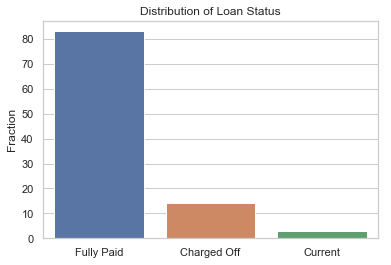

In [40]:
# count values in loan_status
loan_status_distr = round(df.loan_status.value_counts(normalize=True)*100,2)
print(loan_status_distr)
sns.barplot(x=loan_status_distr.index,y=loan_status_distr.values)
plt.title("Distribution of Loan Status")
plt.ylabel("Fraction")
plt.show()


### Outcome:
1. 83% of the borrowers have cleared/ fully paid the loan, which means that most number of borrowers have fully paid 
2. 3% of the borrowers in dataset are still in process of installments
3. 14% of the borrowers in dataset have not paid installments, hence defaulted the loan

In [41]:
# Check number of Current Loans
df[df.loan_status=='Current'].shape[0]

1084

### Remove Current loan Records
Since we dont have much information about customers will default or not for customers who will default or not, lets remove remove them from main dataframe and store it separate. And maybe this will be test set records where we can apply the final model if we develop in future :) 

In [42]:
# Backup Current and remove current loans from main dataframe df
df_current = df[df.loan_status=='Current']
df = df[df.loan_status!='Current']
df.head()

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,issue_month,term,grade,sub_grade,emp_length,home_ownership,verification_status,loan_status,purpose,title,addr_state,earliest_cr_line,issue_d,issue_month,issue_year
0,5000,5000,4975.00,10.65,162.87,24000.00,27.65,0,1,3,0,13648,9,0.00,0.00,5863.16,5833.84,5000.00,863.16,0.00,0.00,0.00,171.62,Dec,36 months,B,B2,10+ years,RENT,Verified,Fully Paid,credit_card,Computer,AZ,Jan-85,Dec-11,Dec,11
1,2500,2500,2500.00,15.27,59.83,30000.00,1.00,0,5,3,0,1687,4,0.00,0.00,1008.71,1008.71,456.46,435.17,0.00,117.08,1.11,119.66,Dec,60 months,C,C4,< 1 year,RENT,Source Verified,Charged Off,car,bike,GA,Apr-99,Dec-11,Dec,11
2,2400,2400,2400.00,15.96,84.33,12252.00,8.72,0,2,2,0,2956,10,0.00,0.00,3005.67,3005.67,2400.00,605.67,0.00,0.00,0.00,649.91,Dec,36 months,C,C5,10+ years,RENT,Not Verified,Fully Paid,small_business,real estate business,IL,Nov-01,Dec-11,Dec,11
3,10000,10000,10000.00,13.49,339.31,49200.00,20.00,0,1,10,0,5598,37,0.00,0.00,12231.89,12231.89,10000.00,2214.92,16.97,0.00,0.00,357.48,Dec,36 months,C,C1,10+ years,RENT,Source Verified,Fully Paid,other,personel,CA,Feb-96,Dec-11,Dec,11
5,5000,5000,5000.00,7.90,156.46,36000.00,11.20,0,3,9,0,7963,12,0.00,0.00,5632.21,5632.21,5000.00,632.21,0.00,0.00,0.00,161.03,Dec,36 months,A,A4,3 years,RENT,Source Verified,Fully Paid,wedding,My wedding loan I promise to pay back,AZ,Nov-04,Dec-11,Dec,11


# Derived Metrics  

## Defaulted - target
Lets create one more column named "defaulted" having 'Yes' if the borrower has defaulted or 'No' if he is still paying or fully paid the loan. Lets Also create 1 or 0 numeric column as derived target variable 

In [43]:
# Create defaulted and Defaulted_num target variables
df["Defaulted"]=df.loan_status.apply(lambda x: "Yes" if x=="Charged Off" else "No")
df["Defaulted_num"]=df.loan_status.apply(lambda x: 1 if x=="Charged Off" else 0)
df.head()

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,issue_month,term,grade,sub_grade,emp_length,home_ownership,verification_status,loan_status,purpose,title,addr_state,earliest_cr_line,issue_d,issue_month,issue_year,Defaulted,Defaulted_num
0,5000,5000,4975.00,10.65,162.87,24000.00,27.65,0,1,3,0,13648,9,0.00,0.00,5863.16,5833.84,5000.00,863.16,0.00,0.00,0.00,171.62,Dec,36 months,B,B2,10+ years,RENT,Verified,Fully Paid,credit_card,Computer,AZ,Jan-85,Dec-11,Dec,11,No,0
1,2500,2500,2500.00,15.27,59.83,30000.00,1.00,0,5,3,0,1687,4,0.00,0.00,1008.71,1008.71,456.46,435.17,0.00,117.08,1.11,119.66,Dec,60 months,C,C4,< 1 year,RENT,Source Verified,Charged Off,car,bike,GA,Apr-99,Dec-11,Dec,11,Yes,1
2,2400,2400,2400.00,15.96,84.33,12252.00,8.72,0,2,2,0,2956,10,0.00,0.00,3005.67,3005.67,2400.00,605.67,0.00,0.00,0.00,649.91,Dec,36 months,C,C5,10+ years,RENT,Not Verified,Fully Paid,small_business,real estate business,IL,Nov-01,Dec-11,Dec,11,No,0
3,10000,10000,10000.00,13.49,339.31,49200.00,20.00,0,1,10,0,5598,37,0.00,0.00,12231.89,12231.89,10000.00,2214.92,16.97,0.00,0.00,357.48,Dec,36 months,C,C1,10+ years,RENT,Source Verified,Fully Paid,other,personel,CA,Feb-96,Dec-11,Dec,11,No,0
5,5000,5000,5000.00,7.90,156.46,36000.00,11.20,0,3,9,0,7963,12,0.00,0.00,5632.21,5632.21,5000.00,632.21,0.00,0.00,0.00,161.03,Dec,36 months,A,A4,3 years,RENT,Source Verified,Fully Paid,wedding,My wedding loan I promise to pay back,AZ,Nov-04,Dec-11,Dec,11,No,0


In [44]:
Markdown("""
### We are finally left with {0} variables to analyse among which is one dependent/target variable named Defaulted
""".format(df.shape[1]))


### We are finally left with 40 variables to analyse among which is one dependent/target variable named Defaulted


## Loan Amount
Lets also create a bins for each loan amount range '0-5000', '5000-10000', '10000-15000', '15000-20000', '20000-25000','25000 and above'. This will help us analyse better for which loan amount ranges, there are more chances of defaulting.

In [45]:
# cut the dataframe into ranges 0, 5000, 10000, 15000, 20000, 25000,40000 
bins_loanamnt = [0, 5000, 10000, 15000, 20000, 25000,40000]
label_amnt = ['0-5000', '5000-10000', '10000-15000', '15000-20000', '20000-25000','25000 and above']
df['loan_amnt_range'] = pd.cut(df['loan_amnt'], bins_loanamnt, labels=label_amnt)
df.head(2)

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,issue_month,term,grade,sub_grade,emp_length,home_ownership,verification_status,loan_status,purpose,title,addr_state,earliest_cr_line,issue_d,issue_month,issue_year,Defaulted,Defaulted_num,loan_amnt_range
0,5000,5000,4975.00,10.65,162.87,24000.00,27.65,0,1,3,0,13648,9,0.00,0.00,5863.16,5833.84,5000.00,863.16,0.00,0.00,0.00,171.62,Dec,36 months,B,B2,10+ years,RENT,Verified,Fully Paid,credit_card,Computer,AZ,Jan-85,Dec-11,Dec,11,No,0,0-5000
1,2500,2500,2500.00,15.27,59.83,30000.00,1.00,0,5,3,0,1687,4,0.00,0.00,1008.71,1008.71,456.46,435.17,0.00,117.08,1.11,119.66,Dec,60 months,C,C4,< 1 year,RENT,Source Verified,Charged Off,car,bike,GA,Apr-99,Dec-11,Dec,11,Yes,1,0-5000


In [46]:
# Check value counts
df.loan_amnt_range.value_counts(normalize=True)

5000-10000        0.33
0-5000            0.24
10000-15000       0.20
15000-20000       0.11
20000-25000       0.07
25000 and above   0.04
Name: loan_amnt_range, dtype: float64

## Employee Experience
Lets also derive one more derived metric which will show which kind of employee experience of borrowers are related  Defaulting. Here we are assuming 
* 0-4 years as Entry-level
* 5-9 years as Mid-level
* 10 and above as Senior Level

#### Convert to Integer column by removing string characters

In [47]:
# Extract integer from string 
import re
df['emp_length'] = df.emp_length.str.replace(r'\D+', '').astype('int')

In [48]:
# Bin the Dataframe into 'Entry-level', 'Mid-level', 'Senior-level' based on emp_length
bin_empexp_labels = ['Entry-level', 'Mid-level', 'Senior-level']
bins_empexp = [0,4,9,df.emp_length.max()]
df['emp_experience'] = pd.cut(df['emp_length'],bins=bins_empexp,labels=bin_empexp_labels)
df.head(2)

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,issue_month,term,grade,sub_grade,emp_length,home_ownership,verification_status,loan_status,purpose,title,addr_state,earliest_cr_line,issue_d,issue_month,issue_year,Defaulted,Defaulted_num,loan_amnt_range,emp_experience
0,5000,5000,4975.00,10.65,162.87,24000.00,27.65,0,1,3,0,13648,9,0.00,0.00,5863.16,5833.84,5000.00,863.16,0.00,0.00,0.00,171.62,Dec,36 months,B,B2,10,RENT,Verified,Fully Paid,credit_card,Computer,AZ,Jan-85,Dec-11,Dec,11,No,0,0-5000,Senior-level
1,2500,2500,2500.00,15.27,59.83,30000.00,1.00,0,5,3,0,1687,4,0.00,0.00,1008.71,1008.71,456.46,435.17,0.00,117.08,1.11,119.66,Dec,60 months,C,C4,1,RENT,Source Verified,Charged Off,car,bike,GA,Apr-99,Dec-11,Dec,11,Yes,1,0-5000,Entry-level


In [49]:
# Print value counts in employee experience
df.emp_experience.value_counts(normalize=True)

Entry-level    0.52
Mid-level      0.26
Senior-level   0.22
Name: emp_experience, dtype: float64

## Annual Income
In this derived metric, we are grouping the borrowers in different classes based on their on the income. This is not based on World Bank guidelines as considering there guidlines, skews our results to just the upper class and we cannot analyse lower incomes loan better. Hence we are assuming 
* 0-25000usd as Lower classs
* 25000-50000 as Lower middle class
* 50000-75000 as Middle Class
* 100000- maximum income as Upper class

In [50]:
# Group the annual income into 'Lower Class', 'Lower Middle Class', 'Middle Class', 'Upper Middle Class', 'Upper Class'
bins_inc = [0, 25000, 50000, 75000, 100000,df['annual_inc'].max()]
slot_inc = ['Lower Class', 'Lower Middle Class', 'Middle Class', 'Upper Middle Class', 'Upper Class']
df['annual_inc_range'] = pd.cut(df['annual_inc'], bins_inc, labels=slot_inc)
df.head(2)

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,issue_month,term,grade,sub_grade,emp_length,home_ownership,verification_status,loan_status,purpose,title,addr_state,earliest_cr_line,issue_d,issue_month,issue_year,Defaulted,Defaulted_num,loan_amnt_range,emp_experience,annual_inc_range
0,5000,5000,4975.00,10.65,162.87,24000.00,27.65,0,1,3,0,13648,9,0.00,0.00,5863.16,5833.84,5000.00,863.16,0.00,0.00,0.00,171.62,Dec,36 months,B,B2,10,RENT,Verified,Fully Paid,credit_card,Computer,AZ,Jan-85,Dec-11,Dec,11,No,0,0-5000,Senior-level,Lower Class
1,2500,2500,2500.00,15.27,59.83,30000.00,1.00,0,5,3,0,1687,4,0.00,0.00,1008.71,1008.71,456.46,435.17,0.00,117.08,1.11,119.66,Dec,60 months,C,C4,1,RENT,Source Verified,Charged Off,car,bike,GA,Apr-99,Dec-11,Dec,11,Yes,1,0-5000,Entry-level,Lower Middle Class


In [51]:
df.annual_inc_range.value_counts()

Lower Middle Class    12396
Middle Class          11458
Upper Middle Class     5972
Upper Class            5054
Lower Class            2275
Name: annual_inc_range, dtype: int64

## Interest Rate
Lets also create bins for interest rates in ranges '0-7.5', '7.5-10', '10-12.5', '12.5-15', '15 and above' to analyse the loans interest rates better

In [52]:
bins_int = [0, 7.5, 10, 12.5, 15, df['int_rate'].max()]
slot_int = ['0-7.5', '7.5-10', '10-12.5', '12.5-15', '15 and above']
df['int_rate_range'] = pd.cut(df['int_rate'], bins_int, labels=slot_int)
df.head(2)

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,issue_month,term,grade,sub_grade,emp_length,home_ownership,verification_status,loan_status,purpose,title,addr_state,earliest_cr_line,issue_d,issue_month,issue_year,Defaulted,Defaulted_num,loan_amnt_range,emp_experience,annual_inc_range,int_rate_range
0,5000,5000,4975.00,10.65,162.87,24000.00,27.65,0,1,3,0,13648,9,0.00,0.00,5863.16,5833.84,5000.00,863.16,0.00,0.00,0.00,171.62,Dec,36 months,B,B2,10,RENT,Verified,Fully Paid,credit_card,Computer,AZ,Jan-85,Dec-11,Dec,11,No,0,0-5000,Senior-level,Lower Class,10-12.5
1,2500,2500,2500.00,15.27,59.83,30000.00,1.00,0,5,3,0,1687,4,0.00,0.00,1008.71,1008.71,456.46,435.17,0.00,117.08,1.11,119.66,Dec,60 months,C,C4,1,RENT,Source Verified,Charged Off,car,bike,GA,Apr-99,Dec-11,Dec,11,Yes,1,0-5000,Entry-level,Lower Middle Class,15 and above


In [53]:
df.int_rate_range.value_counts(normalize=True)

10-12.5        0.24
12.5-15        0.23
15 and above   0.21
7.5-10         0.18
0-7.5          0.14
Name: int_rate_range, dtype: float64

# Correlation between Numeric variables

In [54]:
df.head(2)

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,issue_month,term,grade,sub_grade,emp_length,home_ownership,verification_status,loan_status,purpose,title,addr_state,earliest_cr_line,issue_d,issue_month,issue_year,Defaulted,Defaulted_num,loan_amnt_range,emp_experience,annual_inc_range,int_rate_range
0,5000,5000,4975.00,10.65,162.87,24000.00,27.65,0,1,3,0,13648,9,0.00,0.00,5863.16,5833.84,5000.00,863.16,0.00,0.00,0.00,171.62,Dec,36 months,B,B2,10,RENT,Verified,Fully Paid,credit_card,Computer,AZ,Jan-85,Dec-11,Dec,11,No,0,0-5000,Senior-level,Lower Class,10-12.5
1,2500,2500,2500.00,15.27,59.83,30000.00,1.00,0,5,3,0,1687,4,0.00,0.00,1008.71,1008.71,456.46,435.17,0.00,117.08,1.11,119.66,Dec,60 months,C,C4,1,RENT,Source Verified,Charged Off,car,bike,GA,Apr-99,Dec-11,Dec,11,Yes,1,0-5000,Entry-level,Lower Middle Class,15 and above


In [55]:
# we are using abs() since we are just selecting variables irrespective is positively/negatively correlated
corr = df.corr().abs()
corr

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,emp_length,Defaulted_num
loan_amnt,1.00,0.98,0.94,0.30,0.93,0.41,0.07,0.04,0.01,0.17,0.05,0.31,0.25,nan,nan,0.88,0.84,0.84,0.73,0.05,0.14,0.08,0.47,0.15,0.06
funded_amnt,0.98,1.00,0.95,0.30,0.96,0.41,0.07,0.04,0.01,0.17,0.05,0.30,0.24,nan,nan,0.90,0.86,0.86,0.74,0.05,0.14,0.08,0.48,0.15,0.06
funded_amnt_inv,0.94,0.95,1.00,0.29,0.90,0.39,0.08,0.04,0.01,0.16,0.05,0.28,0.24,nan,nan,0.87,0.91,0.84,0.72,0.03,0.13,0.06,0.47,0.16,0.04
int_rate,0.30,0.30,0.29,1.00,0.27,0.06,0.11,0.16,0.13,0.00,0.10,0.09,0.05,nan,nan,0.29,0.28,0.17,0.52,0.10,0.13,0.07,0.17,0.00,0.21
installment,0.93,0.96,0.90,0.27,1.00,0.41,0.06,0.03,0.01,0.17,0.04,0.30,0.22,nan,nan,0.86,0.81,0.85,0.64,0.06,0.12,0.08,0.41,0.12,0.03
annual_inc,0.41,0.41,0.39,0.06,0.41,1.00,0.11,0.03,0.04,0.26,0.01,0.43,0.38,nan,nan,0.39,0.38,0.39,0.28,0.01,0.04,0.02,0.22,0.17,0.06
dti,0.07,0.07,0.08,0.11,0.06,0.11,1.00,0.03,0.00,0.29,0.01,0.24,0.24,nan,nan,0.07,0.08,0.05,0.11,0.01,0.03,0.01,0.02,0.05,0.04
delinq_2yrs,0.04,0.04,0.04,0.16,0.03,0.03,0.03,1.00,0.01,0.01,0.01,0.06,0.06,nan,nan,0.03,0.04,0.04,0.02,0.03,0.01,0.01,0.02,0.01,0.02
inq_last_6mths,0.01,0.01,0.01,0.13,0.01,0.04,0.00,0.01,1.00,0.09,0.02,0.02,0.11,nan,nan,0.01,0.02,0.03,0.02,0.03,0.02,0.01,0.03,0.01,0.07
open_acc,0.17,0.17,0.16,0.00,0.17,0.26,0.29,0.01,0.09,1.00,0.00,0.29,0.69,nan,nan,0.16,0.15,0.15,0.12,0.02,0.02,0.00,0.08,0.10,0.01


### Heatmap of correlation matrix

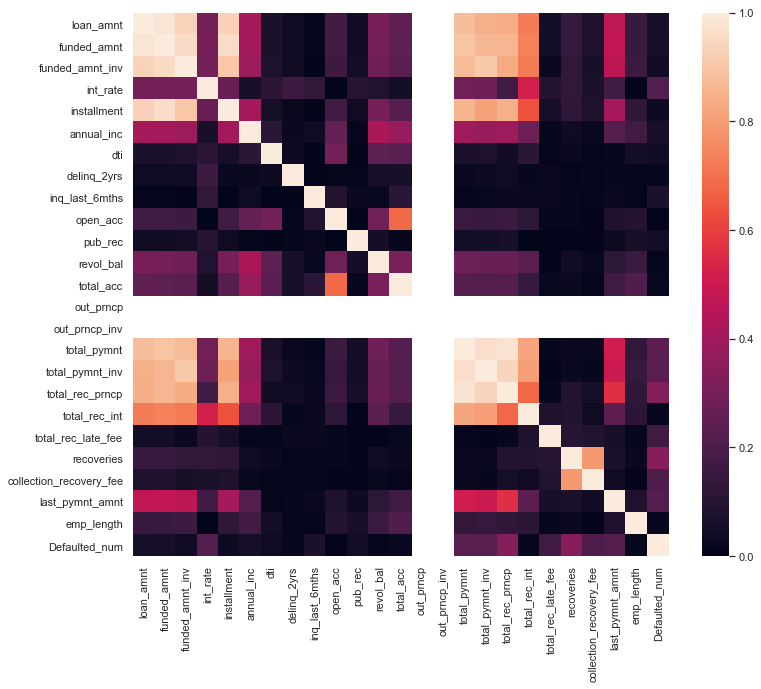

In [56]:
plt.figure(figsize=[12,10])
sns.heatmap(corr)
plt.show()

#### We see no correlation in matrix above, for out_prncp and out_prncp_inv, as the values are NaNs

In [57]:
# Count Distinct in out_prncp
df.out_prncp.value_counts()

0.00    37155
Name: out_prncp, dtype: int64

In [58]:
# Count distince in out_prncp_inv
df.out_prncp_inv.value_counts()

0.00    37155
Name: out_prncp_inv, dtype: int64

### Remove out_prncp and out_prncp_inv as the values are same 

In [59]:
df = df.drop(axis=1,columns=['out_prncp','out_prncp_inv'])
df.head(2)

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,total_acc,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,issue_month,term,grade,sub_grade,emp_length,home_ownership,verification_status,loan_status,purpose,title,addr_state,earliest_cr_line,issue_d,issue_month,issue_year,Defaulted,Defaulted_num,loan_amnt_range,emp_experience,annual_inc_range,int_rate_range
0,5000,5000,4975.00,10.65,162.87,24000.00,27.65,0,1,3,0,13648,9,5863.16,5833.84,5000.00,863.16,0.00,0.00,0.00,171.62,Dec,36 months,B,B2,10,RENT,Verified,Fully Paid,credit_card,Computer,AZ,Jan-85,Dec-11,Dec,11,No,0,0-5000,Senior-level,Lower Class,10-12.5
1,2500,2500,2500.00,15.27,59.83,30000.00,1.00,0,5,3,0,1687,4,1008.71,1008.71,456.46,435.17,0.00,117.08,1.11,119.66,Dec,60 months,C,C4,1,RENT,Source Verified,Charged Off,car,bike,GA,Apr-99,Dec-11,Dec,11,Yes,1,0-5000,Entry-level,Lower Middle Class,15 and above


In [60]:
corr = df.corr().abs()
corr

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,total_acc,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,emp_length,Defaulted_num
loan_amnt,1.00,0.98,0.94,0.30,0.93,0.41,0.07,0.04,0.01,0.17,0.05,0.31,0.25,0.88,0.84,0.84,0.73,0.05,0.14,0.08,0.47,0.15,0.06
funded_amnt,0.98,1.00,0.95,0.30,0.96,0.41,0.07,0.04,0.01,0.17,0.05,0.30,0.24,0.90,0.86,0.86,0.74,0.05,0.14,0.08,0.48,0.15,0.06
funded_amnt_inv,0.94,0.95,1.00,0.29,0.90,0.39,0.08,0.04,0.01,0.16,0.05,0.28,0.24,0.87,0.91,0.84,0.72,0.03,0.13,0.06,0.47,0.16,0.04
int_rate,0.30,0.30,0.29,1.00,0.27,0.06,0.11,0.16,0.13,0.00,0.10,0.09,0.05,0.29,0.28,0.17,0.52,0.10,0.13,0.07,0.17,0.00,0.21
installment,0.93,0.96,0.90,0.27,1.00,0.41,0.06,0.03,0.01,0.17,0.04,0.30,0.22,0.86,0.81,0.85,0.64,0.06,0.12,0.08,0.41,0.12,0.03
annual_inc,0.41,0.41,0.39,0.06,0.41,1.00,0.11,0.03,0.04,0.26,0.01,0.43,0.38,0.39,0.38,0.39,0.28,0.01,0.04,0.02,0.22,0.17,0.06
dti,0.07,0.07,0.08,0.11,0.06,0.11,1.00,0.03,0.00,0.29,0.01,0.24,0.24,0.07,0.08,0.05,0.11,0.01,0.03,0.01,0.02,0.05,0.04
delinq_2yrs,0.04,0.04,0.04,0.16,0.03,0.03,0.03,1.00,0.01,0.01,0.01,0.06,0.06,0.03,0.04,0.04,0.02,0.03,0.01,0.01,0.02,0.01,0.02
inq_last_6mths,0.01,0.01,0.01,0.13,0.01,0.04,0.00,0.01,1.00,0.09,0.02,0.02,0.11,0.01,0.02,0.03,0.02,0.03,0.02,0.01,0.03,0.01,0.07
open_acc,0.17,0.17,0.16,0.00,0.17,0.26,0.29,0.01,0.09,1.00,0.00,0.29,0.69,0.16,0.15,0.15,0.12,0.02,0.02,0.00,0.08,0.10,0.01


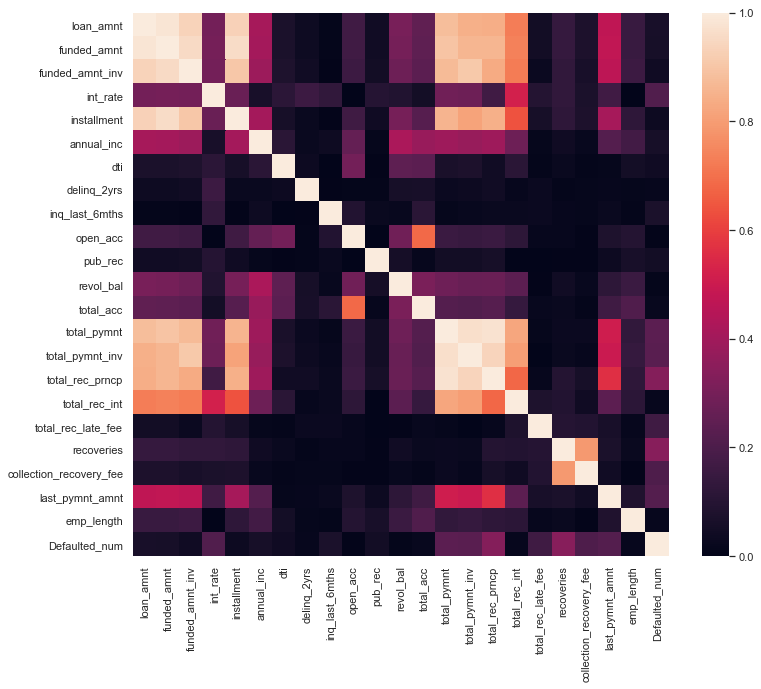

In [61]:
# Plot Heat map again
plt.figure(figsize=[12,10])
sns.heatmap(corr)
plt.show()

In [62]:
# Select upper triangle of correlation matrix
upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(np.bool))
# Find features with correlation greater than 0.95
high_corr_variables = [column for column in upper.columns if any(upper[column] > 0.95)]
high_corr_variables

['funded_amnt',
 'funded_amnt_inv',
 'installment',
 'total_pymnt_inv',
 'total_rec_prncp']

### Outcome
* The variables listed above are highly correlated as the coefficient that we saw are very high. 
* Lets not remove 'funded_amnt','funded_amnt_inv' it right now and as we can compare with loan_amnt in further analysis 
* Lets remove 'installment','total_pymnt_inv','total_rec_prncp' as there are highly correlated

In [63]:
df = df.drop(axis=1,columns=['installment','total_pymnt_inv','total_rec_prncp'])
df.head(2)

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,total_acc,total_pymnt,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,issue_month,term,grade,sub_grade,emp_length,home_ownership,verification_status,loan_status,purpose,title,addr_state,earliest_cr_line,issue_d,issue_month,issue_year,Defaulted,Defaulted_num,loan_amnt_range,emp_experience,annual_inc_range,int_rate_range
0,5000,5000,4975.00,10.65,24000.00,27.65,0,1,3,0,13648,9,5863.16,863.16,0.00,0.00,0.00,171.62,Dec,36 months,B,B2,10,RENT,Verified,Fully Paid,credit_card,Computer,AZ,Jan-85,Dec-11,Dec,11,No,0,0-5000,Senior-level,Lower Class,10-12.5
1,2500,2500,2500.00,15.27,30000.00,1.00,0,5,3,0,1687,4,1008.71,435.17,0.00,117.08,1.11,119.66,Dec,60 months,C,C4,1,RENT,Source Verified,Charged Off,car,bike,GA,Apr-99,Dec-11,Dec,11,Yes,1,0-5000,Entry-level,Lower Middle Class,15 and above


# Hypothesis Testing for Categorical Variable
### Lets check if the category columns that we are using for our analysis and also the derived metrics, are related to target variable or not 
* Lets assume Null Hypothesis, H0 to be
    - if the categorical variable used for analysis does not affect if customer will default or not(Defaulted)
* And Alternate Hypothesis, H1 to be 
    - if the categorical variable used for analysis will affect customer will default or not(Defaulted)
    
Lets choose significance value(alpha) to be 0.05 which is most commonly used value. Significance level as we know, is the one that decides the confidence level to reject the null hypothesis. 

If calculated p-value is less than 0.05 , we reject null hypothesis, hence we are considering the variable for analysis as it has strong relationship. 
If the value is more, we fail to reject null hypothesis , hence we can say that variables are not related to Defaulting. 

In the below code, we are comparing the selected categorical columns and check with Defaulted column if they are not related

In [64]:
# Method used chi-square method readily available in scipy module 
chi2_check = []
selected_chi_cat_columns=['term','grade','sub_grade','purpose','home_ownership','int_rate_range','annual_inc_range','emp_experience']
for i in selected_chi_cat_columns:
    # Check if its less than 5% significance level
    if chi2_contingency(pd.crosstab(df['Defaulted'], df[i]))[1] < 0.05:
        chi2_check.append('Reject Null Hypothesis')
    else:
        chi2_check.append('Fail to Reject Null Hypothesis')
# Transpose column to make it readable 
res = pd.DataFrame(data = [selected_chi_cat_columns, chi2_check] 
             ).T 
res.columns = ['Column', 'Hypothesis']
res

,Column,Hypothesis
0,term,Reject Null Hypothesis
1,grade,Reject Null Hypothesis
2,sub_grade,Reject Null Hypothesis
3,purpose,Reject Null Hypothesis
4,home_ownership,Reject Null Hypothesis
5,int_rate_range,Reject Null Hypothesis
6,annual_inc_range,Reject Null Hypothesis
7,emp_experience,Reject Null Hypothesis


### Observation
We see that all columns we were planning to analyse are related to Defaulting as our null hypothesis is rejected

### But before we come to conclusion, lets perform the same hypothesis testing for each values inside each each variable using the result above where the null hypothesis was rejected. 

In [65]:
check = {}
# For each Rejected Null Hypothesis result
for i in res[res['Hypothesis'] == 'Reject Null Hypothesis']['Column']:
    # Convert to 0s and 1s, to create chi contigency table
    dummies = pd.get_dummies(df[i])
    # Bonferroni-adjusted method for correcting the p-value to p/N, where p= the p-value of the original test and N= the number of planned pairwise comparisons
    bon_p_value = 0.05/df[i].nunique()
    for series in dummies:
        if chi2_contingency(pd.crosstab(df['Defaulted'], dummies[series]))[1] < bon_p_value:
            check['{}-{}'.format(i, series)] = 'Reject Null Hypothesis'
        else:
            check['{}-{}'.format(i, series)] = 'Fail to Reject Null Hypothesis'
res_chi_ph = pd.DataFrame(data = [check.keys(), check.values()]).T
res_chi_ph.columns = ['Pair', 'Hypothesis']
res_chi_ph[res_chi_ph.Hypothesis=='Fail to Reject Null Hypothesis']

,Pair,Hypothesis
17,sub_grade-B4,Fail to Reject Null Hypothesis
18,sub_grade-B5,Fail to Reject Null Hypothesis
19,sub_grade-C1,Fail to Reject Null Hypothesis
20,sub_grade-C2,Fail to Reject Null Hypothesis
22,sub_grade-C4,Fail to Reject Null Hypothesis
24,sub_grade-D1,Fail to Reject Null Hypothesis
42,sub_grade-G4,Fail to Reject Null Hypothesis
43,sub_grade-G5,Fail to Reject Null Hypothesis
47,purpose-educational,Fail to Reject Null Hypothesis
49,purpose-house,Fail to Reject Null Hypothesis


### Lets keep this result to refer later when we are performing analysis on each variable, to disregard each value and keep the ones that are rleated 

# Loan Amount Analysis

## Types of amount in the dataset

* funded_amnt	
    - The total amount committed to that loan at that point in time.
* funded_amnt_inv	
    - The total amount committed by investors for that loan at that point in time.!
* loan_amnt	
    - The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value.

In [66]:
# Check the dataset to get the glimpse of data 
df.head()

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,total_acc,total_pymnt,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,issue_month,term,grade,sub_grade,emp_length,home_ownership,verification_status,loan_status,purpose,title,addr_state,earliest_cr_line,issue_d,issue_month,issue_year,Defaulted,Defaulted_num,loan_amnt_range,emp_experience,annual_inc_range,int_rate_range
0,5000,5000,4975.00,10.65,24000.00,27.65,0,1,3,0,13648,9,5863.16,863.16,0.00,0.00,0.00,171.62,Dec,36 months,B,B2,10,RENT,Verified,Fully Paid,credit_card,Computer,AZ,Jan-85,Dec-11,Dec,11,No,0,0-5000,Senior-level,Lower Class,10-12.5
1,2500,2500,2500.00,15.27,30000.00,1.00,0,5,3,0,1687,4,1008.71,435.17,0.00,117.08,1.11,119.66,Dec,60 months,C,C4,1,RENT,Source Verified,Charged Off,car,bike,GA,Apr-99,Dec-11,Dec,11,Yes,1,0-5000,Entry-level,Lower Middle Class,15 and above
2,2400,2400,2400.00,15.96,12252.00,8.72,0,2,2,0,2956,10,3005.67,605.67,0.00,0.00,0.00,649.91,Dec,36 months,C,C5,10,RENT,Not Verified,Fully Paid,small_business,real estate business,IL,Nov-01,Dec-11,Dec,11,No,0,0-5000,Senior-level,Lower Class,15 and above
3,10000,10000,10000.00,13.49,49200.00,20.00,0,1,10,0,5598,37,12231.89,2214.92,16.97,0.00,0.00,357.48,Dec,36 months,C,C1,10,RENT,Source Verified,Fully Paid,other,personel,CA,Feb-96,Dec-11,Dec,11,No,0,5000-10000,Senior-level,Lower Middle Class,12.5-15
5,5000,5000,5000.00,7.90,36000.00,11.20,0,3,9,0,7963,12,5632.21,632.21,0.00,0.00,0.00,161.03,Dec,36 months,A,A4,3,RENT,Source Verified,Fully Paid,wedding,My wedding loan I promise to pay back,AZ,Nov-04,Dec-11,Dec,11,No,0,0-5000,Entry-level,Lower Middle Class,7.5-10


### Plot box plot for the 3 kinds of loan amount

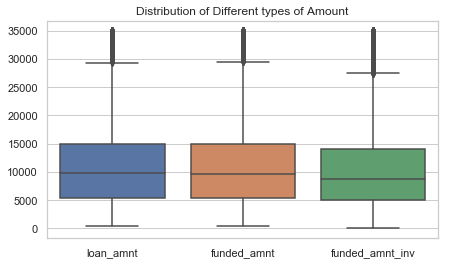

In [67]:
plt.figure(figsize=[7,4])
sns.boxplot(data=df[['loan_amnt','funded_amnt','funded_amnt_inv']])
plt.title("Distribution of Different types of Amount")
plt.show()

### Some stats about Loan Amount 

In [68]:
descri_temp = df.loan_amnt.describe()
descri_temp

count   37155.00
mean    11032.76
std      7270.32
min       500.00
25%      5400.00
50%      9800.00
75%     15000.00
max     35000.00
Name: loan_amnt, dtype: float64

### Outcome:
* Not many outliers present in the loan amount column, and also we can see mean and median is close. Hence we dont need to remove outliers.
* Also the amount applied by the borrower, and amount sanctioned by investor is close as we can see in the box plot. So we can conclude that most of the times, the loan amount requested is sanctioned.
* Most amount of loan is given between 5500 to 15000 USD
* Loan of as minimum as 500 USD and maximum of 5500 USD is given
* We can use just one variable ie., <b>loan amount</b> for analysis instead of others as we can see in box plot the variation is similar and also previously we saw that funded_amnt and funded_amnt_inv are highy correlated


## Loan Amount taken by Defaulters Analysis

### Distribution of Loan Amount of defaulted people

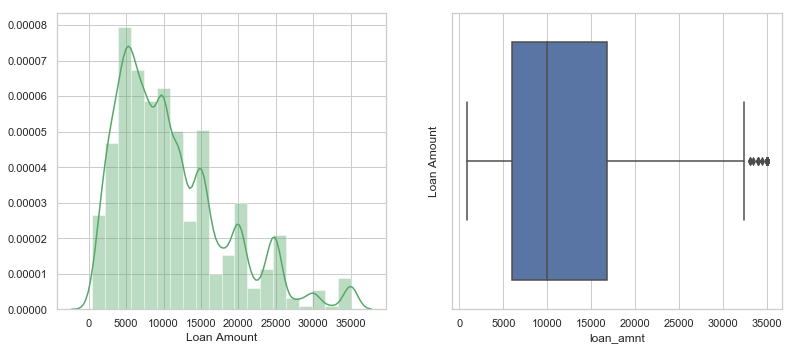

In [69]:
plt.figure(figsize=[13,12])
plt.subplot(2,2,1)
sns.distplot(df.loan_amnt,color='g',bins=20)
plt.xlabel("Loan Amount")
plt.subplot(2,2,2)
sns.boxplot(df[df.Defaulted=='Yes'].loan_amnt)
plt.ylabel("Loan Amount")
plt.show()


### Observation:
* As we can see in distribution plot having the probability density curve, the most amount of loan that are defaulted is around 5000USD.
* Also with probabilty distribution curve we can see that most probable amount that may default is around 5000USD
* We can see that the loan amount that is defaulted is around 5000 to 15000USD in the box plot on the side

### Stats about loan amount taken by defaulted borrowers

In [70]:
df[df.Defaulted=='Yes'].loan_amnt.describe()

count    5356.00
mean    12176.97
std      8040.67
min       900.00
25%      6000.00
50%     10000.00
75%     16750.00
max     35000.00
Name: loan_amnt, dtype: float64

In [71]:
# Total AMount of loss
df[df.Defaulted=='Yes'].loan_amnt.sum()/1e6

65.219875

### Outcome:
* Most of the Defaulted borrowers have taken loan amount are between 900 and 16750 USD
* Also the average amount of loan taken by borrowers are 12176.97 USD
* There are around 5356 borrowers who have defaulted
* The maximum loan amount taken by defaulted borrower is 35000 USD
* Total amount of loss caused by defaulted borrowers are 65M USD

# Probability Charged Off
Our Main motive is find the parameters which are impacting most on Category and derived variables.
So we will use a new term "Probability of Charge-off" to behaviour of different columns.

    Probability of Charge-off = Number of borrowers who charged-off / Total Number of borrowers in that category
We can also say that default rate is same as probabilty of charge off, but we thought probabilty of charge off makes more sense in data science as its actually a probability rather than rate. 

In [72]:
# Create a cross tab df of loan_amnt_range and loan_status and add a column Probability of Charge off
loan_amt_charge_off = pd.crosstab( df['loan_amnt_range'],df['loan_status'],margins = True)
loan_amt_charge_off['Probability_Charged Off'] = round((loan_amt_charge_off['Charged Off']/loan_amt_charge_off['All']),2)
# Removing last record as it contains 
loan_amt_charge_off = loan_amt_charge_off[0:-1]
loan_amt_charge_off

loan_status,Charged Off,Fully Paid,All,Probability_Charged Off
loan_amnt_range,,,,
0-5000,1218,7801,9019,0.14
5000-10000,1567,10816,12383,0.13
10000-15000,1016,6483,7499,0.14
15000-20000,730,3490,4220,0.17
20000-25000,518,2196,2714,0.19
25000 and above,307,1013,1320,0.23


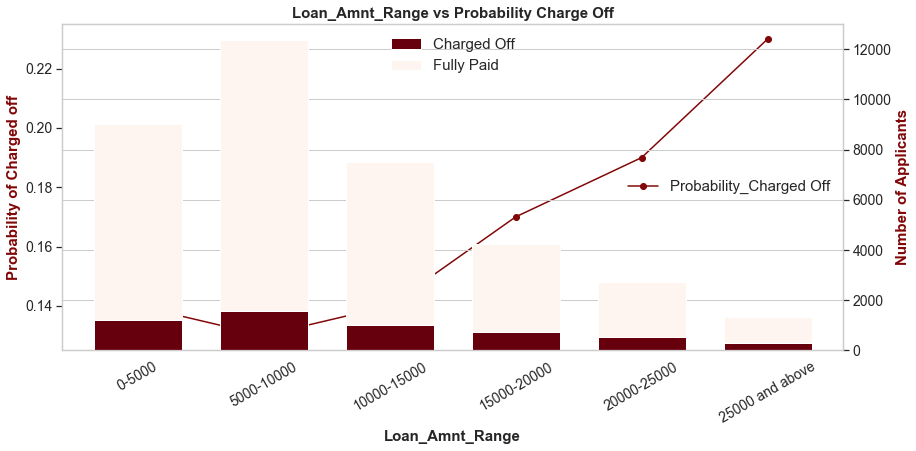

In [73]:
linePlot6 = loan_amt_charge_off[['Probability_Charged Off']]      
barPlot6 =  loan_amt_charge_off.iloc[:,0:2]
ax = linePlot6.plot(figsize=(14,6), marker='o',color = '#810607')
ax2 = barPlot6.plot(kind='bar',ax = ax,rot=1,secondary_y=True,stacked=True,fontsize=14,colormap='Reds_r',width =0.7)
ax.set_title(df['loan_amnt_range'].name.title()+' vs Probability Charge Off',fontsize=15,weight="bold")
ax.set_xlabel(df['loan_amnt_range'].name.title(),fontsize=15,weight="bold")
ax.set_ylabel('Probability of Charged off',color = '#810607',fontsize=15,weight="bold")
ax2.set_ylabel('Number of Applicants',color = '#810607',fontsize=15,weight="bold")
plt.style.use('seaborn-darkgrid')
ax.legend(loc='center right',fontsize=15)
ax2.legend(loc='upper center',fontsize=15)
ax.tick_params(axis='x', rotation=30)
plt.show()

### Observation: 
* Here we can see that Probability of charge off is increasing as loan amount increases.
* We see that peak is in range 25000 and above usd, which means that its more probable that a loan will default around this range. 
* The lowest probability of charge off is in the range 5000-10000USD

----------

# Geographical Characteristics

## State Analysis

### Lets find the state names for the state codes/abbreviations in our dataset.
This is a Dataset used for finding the State names for the state abbreviations given in the dataset:<br>
https://raw.githubusercontent.com/jasonong/List-of-US-States/master/states.csv

In [74]:
# Load the dataset from github link above
state_names_df=pd.read_csv('https://raw.githubusercontent.com/jasonong/List-of-US-States/master/states.csv')
state_names_df.head()

,State,Abbreviation
0,Alabama,AL
1,Alaska,AK
2,Arizona,AZ
3,Arkansas,AR
4,California,CA


### Add the state names in Main Dataframe from the above states dataframe

In [75]:
# Merge the dataset to main dataframe
df = pd.merge(df,state_names_df,how='left',left_on='addr_state',right_on='Abbreviation')
# Drop the extra Abbreviation columns
df = df.drop(labels="Abbreviation",axis=1)
print("Null values in state names columns",df.State.isnull().sum())
df.head(3)

Null values in state names columns 0


,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,total_acc,total_pymnt,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,issue_month,term,grade,sub_grade,emp_length,home_ownership,verification_status,loan_status,purpose,title,addr_state,earliest_cr_line,issue_d,issue_month,issue_year,Defaulted,Defaulted_num,loan_amnt_range,emp_experience,annual_inc_range,int_rate_range,State
0,5000,5000,4975.00,10.65,24000.00,27.65,0,1,3,0,13648,9,5863.16,863.16,0.00,0.00,0.00,171.62,Dec,36 months,B,B2,10,RENT,Verified,Fully Paid,credit_card,Computer,AZ,Jan-85,Dec-11,Dec,11,No,0,0-5000,Senior-level,Lower Class,10-12.5,Arizona
1,2500,2500,2500.00,15.27,30000.00,1.00,0,5,3,0,1687,4,1008.71,435.17,0.00,117.08,1.11,119.66,Dec,60 months,C,C4,1,RENT,Source Verified,Charged Off,car,bike,GA,Apr-99,Dec-11,Dec,11,Yes,1,0-5000,Entry-level,Lower Middle Class,15 and above,Georgia
2,2400,2400,2400.00,15.96,12252.00,8.72,0,2,2,0,2956,10,3005.67,605.67,0.00,0.00,0.00,649.91,Dec,36 months,C,C5,10,RENT,Not Verified,Fully Paid,small_business,real estate business,IL,Nov-01,Dec-11,Dec,11,No,0,0-5000,Senior-level,Lower Class,15 and above,Illinois


### Total Defaulted amount in each state

In [76]:
# Sum the defaulted amount in each states
df_state_sum = pd.DataFrame(df[df.Defaulted=='Yes'].groupby("addr_state")['loan_amnt'].sum().sort_values(ascending=False)).reset_index()
df_state_sum = pd.merge(df_state_sum,state_names_df,right_on="Abbreviation",left_on="addr_state")
df_state_sum = df_state_sum.rename(columns={'loan_amnt': 'Sum_of_Loan_Amnt'})

df_state_sum.head(10)

,addr_state,Sum_of_Loan_Amnt,State,Abbreviation
0,CA,13063400,California,CA
1,NY,5772925,New York,NY
2,FL,5536975,Florida,FL
3,TX,3854275,Texas,TX
4,NJ,3479825,New Jersey,NJ
5,GA,2416750,Georgia,GA
6,IL,2366325,Illinois,IL
7,VA,2198375,Virginia,VA
8,PA,1968750,Pennsylvania,PA
9,MD,1928150,Maryland,MD


In [77]:
fig = px.choropleth(data_frame=df_state_sum
                    ,locations='addr_state',
                    locationmode='USA-states',
                   color='Sum_of_Loan_Amnt',
                   hover_name="State",
                   scope="usa"
                   ,color_continuous_scale=px.colors.sequential.Plasma_r
                   )
fig.show()

### Total count of defaulted amount in each state

In [78]:
df_state_count = pd.DataFrame(df[df.Defaulted=='Yes'].groupby("addr_state")['loan_amnt'].count().sort_values(ascending=False)).reset_index()
df_state_count = pd.merge(df_state_count,state_names_df,right_on="Abbreviation",left_on="addr_state")
df_state_count = df_state_count.rename(columns={'loan_amnt': 'Number_of_Defaulter'})

df_state_count.head(10)

,addr_state,Number_of_Defaulter,State,Abbreviation
0,CA,1065,California,CA
1,FL,475,Florida,FL
2,NY,470,New York,NY
3,TX,306,Texas,TX
4,NJ,275,New Jersey,NJ
5,GA,209,Georgia,GA
6,IL,193,Illinois,IL
7,VA,172,Virginia,VA
8,PA,168,Pennsylvania,PA
9,MD,157,Maryland,MD


In [79]:
fig = px.choropleth(data_frame=df_state_count
                    ,locations='addr_state',
                    locationmode='USA-states',
                   color='Number_of_Defaulter',
                   hover_name="State",
                   scope="usa"
                   ,color_continuous_scale=px.colors.sequential.Plasma_r
                   )
fig.show()

### Outcome of State Analysis:
* As we can see above, Most amount and most number of defaults are happening by the borrowers who are in states like California, New York, Florida, Texas 
* Hence we can recommend the investors to be extra cautious and more verification can be done when lending loan to borrowers from these states

### Probability of Charge-off for State 

In [80]:
state_charge_off = pd.crosstab( df['State'],df['loan_status'],margins = True)
state_charge_off['Probability_Charged Off'] = round((state_charge_off['Charged Off']/state_charge_off['All']),2)

# Removing last record as it contains 
state_charge_off = state_charge_off[0:-1]

state_charge_off[(state_charge_off['Probability_Charged Off']==0) | (state_charge_off['All']<10)]

loan_status,Charged Off,Fully Paid,All,Probability_Charged Off
State,,,,
Idaho,1,5,6,0.17
Indiana,0,9,9,0.00
Iowa,0,5,5,0.00
Maine,0,3,3,0.00
Nebraska,3,2,5,0.60


In [81]:
# Removing the states with  probability of charge off is zero as it is not helpful for our plot
# So we will analyze all the states where number of applicant is 10 or more and probablity of charge of >0.
state_charge_off = state_charge_off[state_charge_off["Probability_Charged Off"]>0]
state_charge_off = state_charge_off[state_charge_off["All"]>10]
state_charge_off

loan_status,Charged Off,Fully Paid,All,Probability_Charged Off
State,,,,
Alabama,51,364,415,0.12
Alaska,14,61,75,0.19
Arizona,112,683,795,0.14
Arkansas,26,201,227,0.11
California,1065,5636,6701,0.16
Colorado,90,643,733,0.12
Connecticut,89,604,693,0.13
Delaware,12,98,110,0.11
District of Columbia,15,196,211,0.07


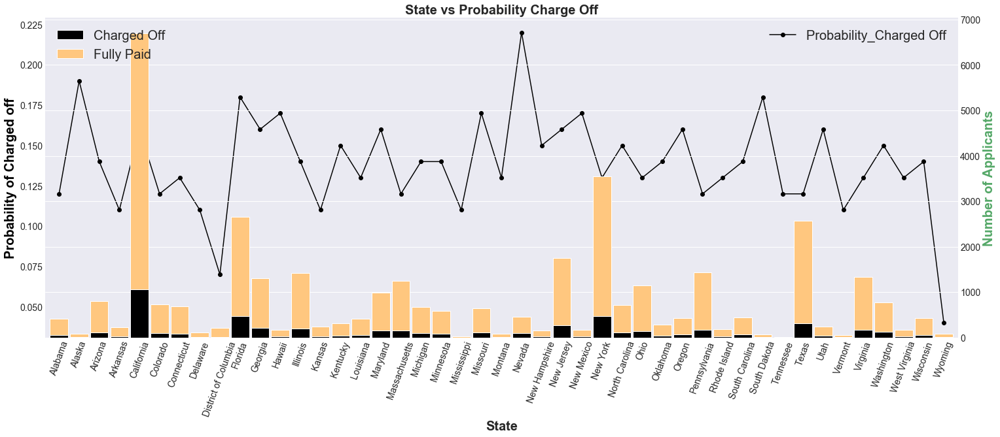

In [82]:
linePlot4 = state_charge_off[['Probability_Charged Off']]      
barPlot4 =  state_charge_off.iloc[:,0:2]
ax = linePlot4.plot(figsize=(25,9), marker='o',color = '#000000')
ax2 = barPlot4.plot(kind='bar',ax = ax,rot=1,secondary_y=True,stacked=True,fontsize=14,colormap='copper',width =0.9)
ax.set_title(df['State'].name.title()+' vs Probability Charge Off',fontsize=20,weight="bold")
ax.set_xlabel(df['State'].name.title(),fontsize=20,weight="bold")
ax.set_ylabel('Probability of Charged off',color = '#000000',fontsize=20,weight="bold")
ax2.set_ylabel('Number of Applicants',color = 'g',fontsize=20,weight="bold")

#ax.plot([.22], ["Nevada"],'o')
#ax.annotate('peak', xy=(.22,"Nevada"), xytext=(10, 4), fontsize=12,arrowprops = dict(facecolor='black', shrink=0.05))
#ax.set_yticks([0.100,0.125,0.150,0.175,0.200,0.225,0.250,0.500])
ax.legend(loc='upper right',fontsize=20)
ax2.legend(loc='upper left',fontsize=20)
ax.tick_params(axis='x', rotation=70)
plt.show()


### Observation:
From above plot, it is clear that :
1. Nevada is being the most risky state with 22% of charge off probability.
2. Alska, Tennessee, South Dakota, Hawaii, New Mexico, Florida, Missouri, Oregon, California, Georgia, Maryland, New Hampshire, New Jersey, North Carolina, Utah and Washington being the next more risky set of states having 15% or more probability of Charge off.
3. Wyoming being the least risky state with 4% of charge off probability and District of Columbia being second with 7% of probability charge off.
4. Average probability of charge off is 14% and most of the values falls between 12 to 15%


---------------

# Loan Characteristics

## Purpose of Defaulting Analysis

### Lets find the purpose of defaulting 
* variables used:
    - purpose : A category provided by the borrower for the loan request.
    - title : The loan title provided by the borrower
* We can check the purpose variable to see where the loan amount is used, 
* Is it risky business or purpose he is investing in
* which purpose has more chances of getting defaulted 
* This way we can analyse risk factors associated with purpose of loan

In [83]:
# print the dataset
df.head(2)

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,total_acc,total_pymnt,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,issue_month,term,grade,sub_grade,emp_length,home_ownership,verification_status,loan_status,purpose,title,addr_state,earliest_cr_line,issue_d,issue_month,issue_year,Defaulted,Defaulted_num,loan_amnt_range,emp_experience,annual_inc_range,int_rate_range,State
0,5000,5000,4975.00,10.65,24000.00,27.65,0,1,3,0,13648,9,5863.16,863.16,0.00,0.00,0.00,171.62,Dec,36 months,B,B2,10,RENT,Verified,Fully Paid,credit_card,Computer,AZ,Jan-85,Dec-11,Dec,11,No,0,0-5000,Senior-level,Lower Class,10-12.5,Arizona
1,2500,2500,2500.00,15.27,30000.00,1.00,0,5,3,0,1687,4,1008.71,435.17,0.00,117.08,1.11,119.66,Dec,60 months,C,C4,1,RENT,Source Verified,Charged Off,car,bike,GA,Apr-99,Dec-11,Dec,11,Yes,1,0-5000,Entry-level,Lower Middle Class,15 and above,Georgia


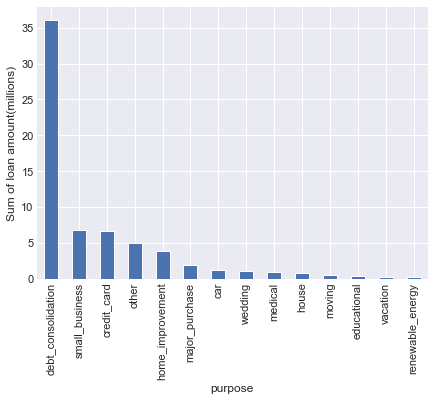

In [84]:
# calculate sum of loan amount by defaulters in 
plt.figure(figsize=[7,5])
def_purpose = df[df.Defaulted=='Yes'].groupby('purpose')['loan_amnt'].sum().sort_values(ascending=False)/1e6
def_purpose.plot.bar()
plt.ylabel("Sum of loan amount(millions)")
plt.show()

### Observation:
* We can see that most amount of loss has happened because loans given for these purposes 'Debt Consolidation' , 'Credit Card' , 'Small Businesses'. 

### Probability of Charge-off for Purpose of Loan

In [85]:
# Using CrossTab to Calculate 
purpose_charge_off = pd.crosstab( df['purpose'],df['loan_status'],margins = True)
purpose_charge_off['Probability_Charged Off'] = round((purpose_charge_off['Charged Off']/purpose_charge_off['All']),3)
purpose_charge_off = purpose_charge_off[0:-1]
purpose_charge_off

loan_status,Charged Off,Fully Paid,All,Probability_Charged Off
purpose,,,,
car,155,1286,1441,0.11
credit_card,505,4354,4859,0.10
debt_consolidation,2663,14873,17536,0.15
educational,51,262,313,0.16
home_improvement,321,2386,2707,0.12
house,58,286,344,0.17
major_purchase,209,1849,2058,0.10
medical,101,548,649,0.16
moving,83,463,546,0.15


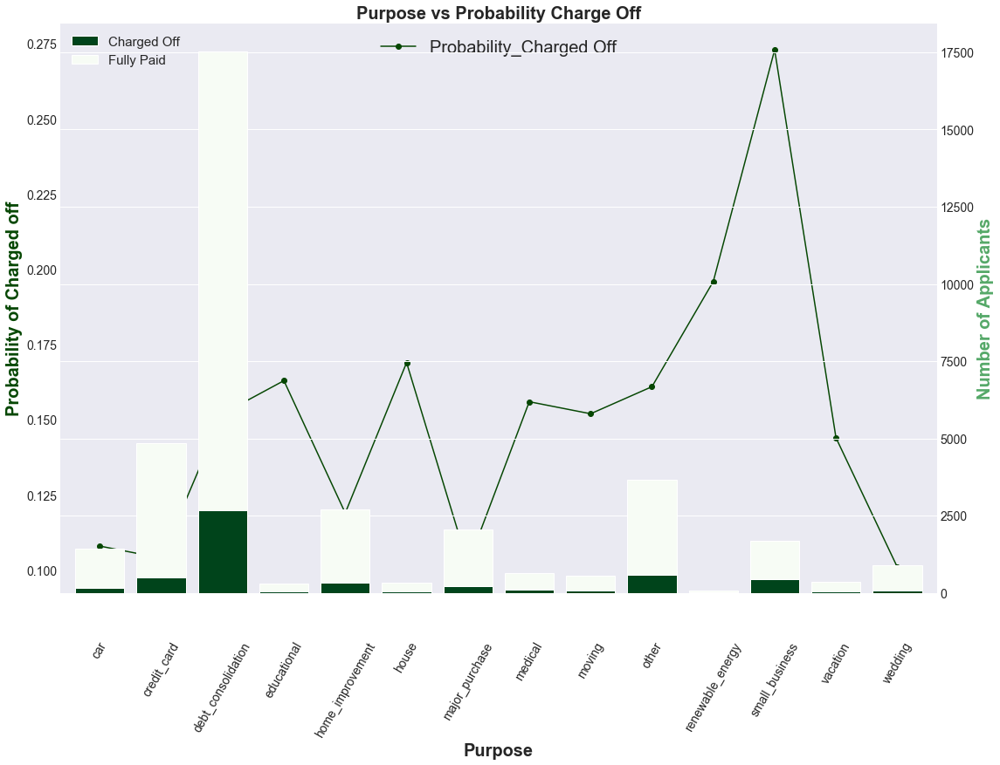

In [86]:
linePlot = purpose_charge_off[['Probability_Charged Off']]      
barPlot =  purpose_charge_off.iloc[:,0:2]
ax = linePlot.plot(figsize=(18,12), marker='o',color = '#064703')
ax2 = barPlot.plot(kind='bar',ax = ax,rot=1,secondary_y=True,stacked=True,fontsize=14,colormap='Greens_r',width=0.8)
ax.set_title(df['purpose'].name.title()+' vs Probability Charge Off',fontsize=20,weight="bold")
ax.set_xlabel(df['purpose'].name.title(),fontsize=20,weight="bold")
ax.set_ylabel('Probability of Charged off',color = '#064703',fontsize=20,weight="bold")
ax2.set_ylabel('Number of Applicants',color = 'g',fontsize=20,weight="bold")

#ax.set_yticks([0.025,0.100,0.125,0.150,0.175,0.200,0.225,0.300])
ax.legend(loc='upper center',fontsize=20)
ax2.legend(loc='upper left',fontsize=15)
ax.tick_params(axis='x', rotation=60,color = 'g',size = 50)
plt.show()

### Observation:
1. Small Business is having the highest probability of charge off:- 27%
2. Wedding is having least probability of charge off:- 9%
3. renewable energy, house,  educational are being the next riskiest purposes.
4. Most of applicants took loan for debt consolidation and credit cards and probability of charge-off is also comparatively less for these.
5. major_purchase is having least probability.
6. Hence, We can ask the investors/bank to be more cautious to when giving loan for these purposes(renewable energy, house,  educational ).


In [87]:
# Check the Different values in title field
df_agg = pd.DataFrame(df[df.purpose.isin(["debt_consolidation",'credit_card','small_business','other','home_improvement']) & (df.Defaulted=='Yes')].groupby(['purpose','title'])['loan_amnt'].sum())
df_agg.rename(columns={'loan_amnt':'sum_amnt_title'})

sum_amnt_title
purpose        title                                                             
credit_card     Credit Consolidation                                        12000
               **Pay off 3 to 10 yr old CC debt in 3yrs for th...           15000
               1969 lemans                                                  20000
               2010                                                          4000
               2011 REFINANCE                                               35000
...                                                                           ...
small_business start up                                                      6800
               sushiking                                                    10000
               tattoo shop                                                  14000
               to pay my loan                                                6000
               unsecured personal loan                                      15000

[2719 rows x 1 columns]

In [88]:
df_top5_3_purpose = pd.DataFrame(df_agg['loan_amnt'].groupby(level=0, group_keys=False).nlargest(3))
df_top5_3_purpose = df_top5_3_purpose.rename(columns={"loan_amnt":"sum_title_amnt"})
df_top5_3_purpose

sum_title_amnt
purpose            title                                  
credit_card        Credit Card Loan                 345250
                   Credit Card                      187800
                   Debt Consolidation               107350
debt_consolidation Debt Consolidation              4110125
                   Debt Consolidation Loan         3898025
                   debt consolidation              1210375
home_improvement   Home Improvement                 592850
                   Home Improvement Loan            267500
                   home improvement                 219775
other              Other Loan                       376350
                   Personal Loan                    367050
                   Personal                         199925
small_business     Small Business Loan             1675625
                   Small Business                   237250
                   Business Loan                    229750

### Observation:
* We plotted the largest three titles given in the defaulting loans for the top 5 purposes of Loans namely, "debt_consolidation",'credit_card','small_business','other','home_improvement'. 
* We did this because we can get what title of loan do the borrowers give for each purpose so that the lenders can get decide correctly before they actually decide to give loan
* We couldnt find much information as the titles matches purposes.

## Grades and subgrades of Loan Analysis
### Variables
- grade
    - Loan grading is a classification system that involves assigning a quality score to a loan based on a borrower's credit history, quality of the collateral, and the likelihood of repayment of the principal and interest.Lending Club categorizes borrowers into seven different loan grades from A down to G, A-grade being the safest

- sub_grade
    - There are 35 loan subgrades in total for borrowers from A1 down to G5,A1-subgrade being the safest


### Sum of Defaulted Loans in each Grade

In [89]:
(df[df.Defaulted=='Yes'].groupby('grade')['loan_amnt'].sum().sort_values(ascending=False)/1e6).reset_index()

,grade,loan_amnt
0,B,14.80
1,C,14.30
2,D,13.20
3,E,10.84
4,F,5.81
5,A,4.45
6,G,1.82


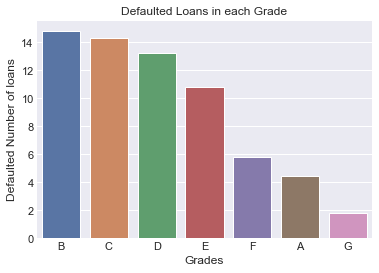

In [90]:
# Sum of defauletd loan amount for each grade
sns.barplot(data=(df[df.Defaulted=='Yes'].groupby('grade')['loan_amnt'].sum().sort_values(ascending=False)/1e6).reset_index(),x='grade',y='loan_amnt')
plt.title("Defaulted Loans in each Grade")
plt.ylabel("Defaulted Number of loans")
plt.xlabel("Grades")
plt.show()

### Observation
* We can see that most of amount of loans that are defaulted are more in Grade B followed by C and then D. So the order of Grades where B being the safest among these, is definitely not followed in the dataset we have. 
* Also we can see that Grade G which is the un safest grade given for loan, the defaulting that has happened is less.
* But to analyze it better, we would need check the sub grades as we can get a better picture of whats happening under each grade.

### Analysing Grade and Sub grades together

In [91]:
fig = px.treemap(df, path=['Defaulted','grade' ,'sub_grade'], values='loan_amnt')
fig.show()

### Observation:
* Most number of Non Default Loans are actually in A1-A5, B1-B5,C1-C5 Subgrades, So for Loans which are turning out to be Good Loans are actually following the grading system. 
* But when it comes to Defaulted Loans, we can see that B3,B4,B5 and C1,C2 are turning out to be large number of Defaults . 
* So, we can ask lenders be more upto date with borrowers to whom they have given loans that lie in B Grade(especially B3-B5) or C Grade Loans(especially C1-C2), as the probabilty of defaulting is more in these grades

### Probability of Charge-off for Grade of Loan

In [92]:
grade_charge_off = pd.crosstab( df['grade'],df['loan_status'],margins = True)
grade_charge_off['Probability_Charged Off'] = round((grade_charge_off['Charged Off']/grade_charge_off['All']),3)
grade_charge_off = grade_charge_off[0:-1]
grade_charge_off

loan_status,Charged Off,Fully Paid,All,Probability_Charged Off
grade,,,,
A,557,9035,9592,0.06
B,1345,9919,11264,0.12
C,1283,6306,7589,0.17
D,1079,3840,4919,0.22
E,688,1879,2567,0.27
F,306,630,936,0.33
G,98,190,288,0.34


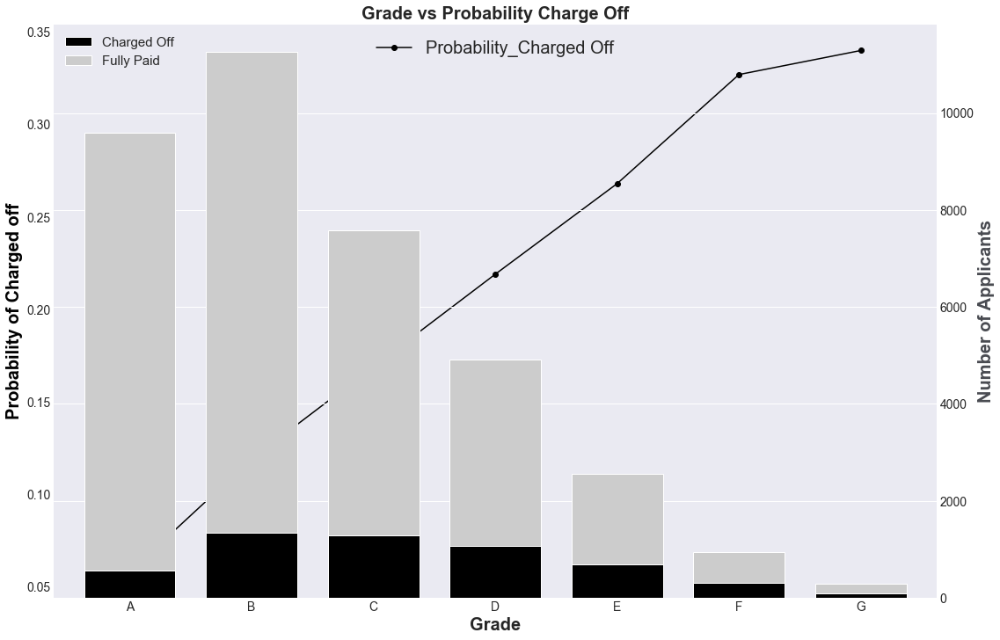

In [93]:
linePlot2 = grade_charge_off[['Probability_Charged Off']]      
barPlot2 =  grade_charge_off.iloc[:,0:2]
ax = linePlot2.plot(figsize=(18,12), marker='o',color = '#000000')
ax2 = barPlot2.plot(kind='bar',ax = ax,rot=1,secondary_y=True,stacked=True,fontsize=14,colormap='nipy_spectral',width = 0.75)
ax.set_title(df['grade'].name.title()+' vs Probability Charge Off',fontsize=20,weight="bold")
ax.set_xlabel(df['grade'].name.title(),fontsize=20,weight="bold")
ax.set_ylabel('Probability of Charged off',color = '#000000',fontsize=20,weight="bold")
ax2.set_ylabel('Number of Applicants',color = '#484A50',fontsize=20,weight="bold")

#ax.set_yticks([0.100,0.125,0.150,0.175,0.200,0.225,0.250,0.900])
ax.legend(loc='upper center',fontsize=20)
ax2.legend(loc='upper left',fontsize=15)
#ax.tick_params(axis='x', rotation=90)
plt.show()

### Observation
1. As we can see that probability of charge off is increasing with each grade going down.
2. Grade E, F, G are having 27, 32 and 33 percent of probability of charge off making it most defaulted Grade.
3. Hence, We can ask the investors/bank to be more cautious to when giving loan for these Grade and check other variables carefully.
4. Most number of applicants belongs to A and B grade where probability of charges-off is comparatively lower.


### Probability of Charge-off for Sub Grade of Loan

In [94]:
subgrade_charge_off = pd.crosstab( df['sub_grade'],df['loan_status'],margins = True)
subgrade_charge_off['Probability_Charged Off'] = round((subgrade_charge_off['Charged Off']/subgrade_charge_off['All']),3)
subgrade_charge_off = subgrade_charge_off[0:-1]
subgrade_charge_off.head(2)

loan_status,Charged Off,Fully Paid,All,Probability_Charged Off
sub_grade,,,,
A1,24,1021,1045,0.02
A2,68,1364,1432,0.05


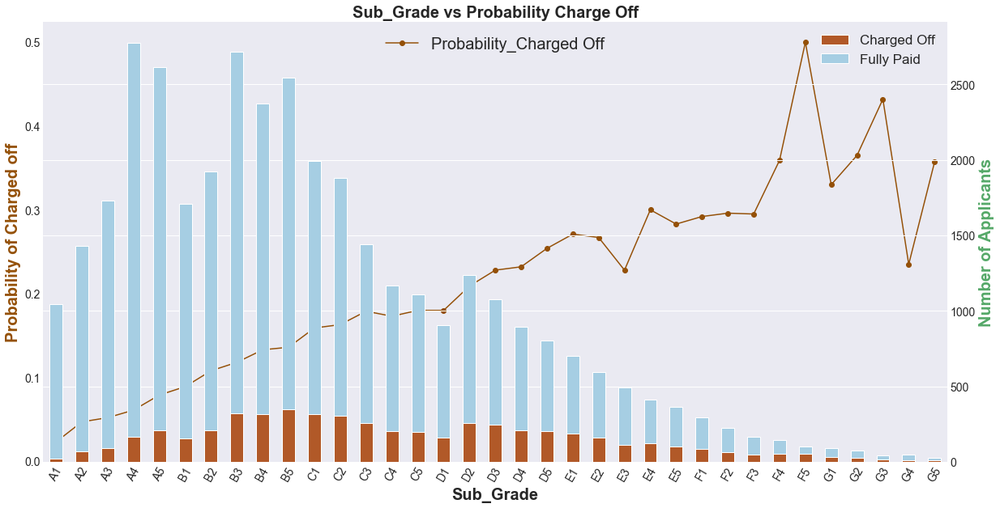

In [95]:
linePlot3 = subgrade_charge_off[['Probability_Charged Off']]      
barPlot3 =  subgrade_charge_off.iloc[:,0:2]
ax = linePlot3.plot(figsize=(20,10), marker='o',color = '#945007')
ax2 = barPlot3.plot(kind='bar',ax = ax,rot=1,secondary_y=True,stacked=True,fontsize=14,colormap='Paired_r',width = 0.50)
ax.set_title(df['sub_grade'].name.title()+' vs Probability Charge Off',fontsize=20,weight="bold")
ax.set_xlabel(df['sub_grade'].name.title(),fontsize=20,weight="bold")
ax.set_ylabel('Probability of Charged off',color = '#945007',fontsize=20,weight="bold")
ax2.set_ylabel('Number of Applicants',color = 'g',fontsize=20,weight="bold")

#ax.set_yticks([0.100,0.125,0.150,0.175,0.200,0.225,0.250,0.500])
ax.legend(loc='upper center',fontsize=20)
ax2.legend(loc='upper right',fontsize=17)
ax.tick_params(axis='x', rotation=60)
plt.show()

### Observation
1. Sub Grade F5 and G3 are two riskiest subgrade.
2. And Subgrade A1..A5 and B1 are subgrade with less than 10 percent of Probability of charge off.

In [96]:
df.head()

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,total_acc,total_pymnt,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,issue_month,term,grade,sub_grade,emp_length,home_ownership,verification_status,loan_status,purpose,title,addr_state,earliest_cr_line,issue_d,issue_month,issue_year,Defaulted,Defaulted_num,loan_amnt_range,emp_experience,annual_inc_range,int_rate_range,State
0,5000,5000,4975.00,10.65,24000.00,27.65,0,1,3,0,13648,9,5863.16,863.16,0.00,0.00,0.00,171.62,Dec,36 months,B,B2,10,RENT,Verified,Fully Paid,credit_card,Computer,AZ,Jan-85,Dec-11,Dec,11,No,0,0-5000,Senior-level,Lower Class,10-12.5,Arizona
1,2500,2500,2500.00,15.27,30000.00,1.00,0,5,3,0,1687,4,1008.71,435.17,0.00,117.08,1.11,119.66,Dec,60 months,C,C4,1,RENT,Source Verified,Charged Off,car,bike,GA,Apr-99,Dec-11,Dec,11,Yes,1,0-5000,Entry-level,Lower Middle Class,15 and above,Georgia
2,2400,2400,2400.00,15.96,12252.00,8.72,0,2,2,0,2956,10,3005.67,605.67,0.00,0.00,0.00,649.91,Dec,36 months,C,C5,10,RENT,Not Verified,Fully Paid,small_business,real estate business,IL,Nov-01,Dec-11,Dec,11,No,0,0-5000,Senior-level,Lower Class,15 and above,Illinois
3,10000,10000,10000.00,13.49,49200.00,20.00,0,1,10,0,5598,37,12231.89,2214.92,16.97,0.00,0.00,357.48,Dec,36 months,C,C1,10,RENT,Source Verified,Fully Paid,other,personel,CA,Feb-96,Dec-11,Dec,11,No,0,5000-10000,Senior-level,Lower Middle Class,12.5-15,California
4,5000,5000,5000.00,7.90,36000.00,11.20,0,3,9,0,7963,12,5632.21,632.21,0.00,0.00,0.00,161.03,Dec,36 months,A,A4,3,RENT,Source Verified,Fully Paid,wedding,My wedding loan I promise to pay back,AZ,Nov-04,Dec-11,Dec,11,No,0,0-5000,Entry-level,Lower Middle Class,7.5-10,Arizona


## Loan Term Analysis

In [97]:
loan_term_charge_off = pd.crosstab( df['term'],df['loan_status'],margins = True)
loan_term_charge_off['Probability_Charged Off'] = round((loan_term_charge_off['Charged Off']/loan_term_charge_off['All']),3)
loan_term_charge_off = loan_term_charge_off[0:-1]
loan_term_charge_off

loan_status,Charged Off,Fully Paid,All,Probability_Charged Off
term,,,,
36 months,3048,24959,28007,0.11
60 months,2308,6840,9148,0.25


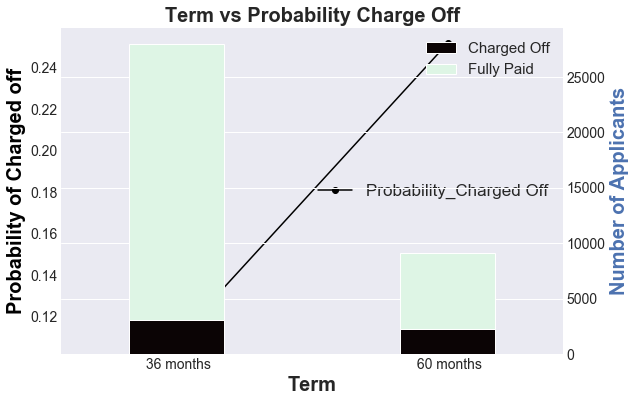

In [98]:
linePlot7 = loan_term_charge_off[['Probability_Charged Off']]      
barPlot7 =  loan_term_charge_off.iloc[:,0:2]
ax = linePlot7.plot(figsize=(9,6), marker='o',color = '#000000')
ax2 = barPlot7.plot(kind='bar',ax = ax,rot=1,secondary_y=True,stacked=True,fontsize=14,colormap='mako',width =0.35)
ax.set_title(df['term'].name.title()+' vs Probability Charge Off',fontsize=20,weight="bold")
ax.set_xlabel(df['term'].name.title(),fontsize=20,weight="bold")
ax.set_ylabel('Probability of Charged off',color = '#000000',fontsize=20,weight="bold")
ax2.set_ylabel('Number of Applicants',color = 'b',fontsize=20,weight="bold")
#plt.style.use('seaborn-darkgrid')
#ax.set_yticks([0.100,0.125,0.150,0.175,0.200,0.225,0.250,0.500])
ax.tick_params(axis='x', rotation=0)
ax.legend(loc='center right',fontsize=17)
ax2.legend(loc='upper right',fontsize=15)
plt.show()

### Observation 
1. We can see that 60 months is having 2.5 times more probability of charge- off than 36 months probability
2. Hence we can suggest investor/bank check for other characteristics in term 60 months.

### Int_rate_range  Proability of Charge-Off

In [99]:
#Int_rate_range Charge Proability
Int_rate_charge_off = pd.crosstab( df['int_rate_range'],df['loan_status'],margins = True)
Int_rate_charge_off['Probability_Charged Off'] = round((Int_rate_charge_off['Charged Off']/Int_rate_charge_off['All']),2)
# Removing last record as it contains 
Int_rate_charge_off = Int_rate_charge_off[0:-1]
Int_rate_charge_off

loan_status,Charged Off,Fully Paid,All,Probability_Charged Off
int_rate_range,,,,
0-7.5,231,4848,5079,0.05
7.5-10,527,6139,6666,0.08
10-12.5,1177,7915,9092,0.13
12.5-15,1412,7207,8619,0.16
15 and above,2009,5690,7699,0.26


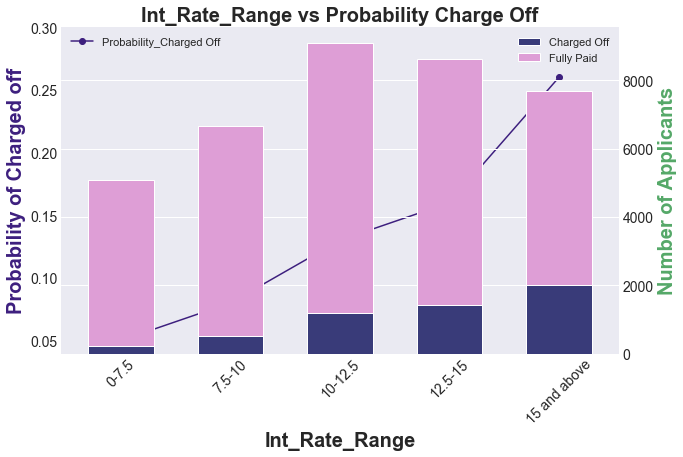

In [100]:
linePlot9 = Int_rate_charge_off[['Probability_Charged Off']]      
barPlot9 =  Int_rate_charge_off.iloc[:,0:2]
ax = linePlot9.plot(figsize=(10,6), marker='o',color = '#3D1F7E')
ax2 = barPlot9.plot(kind='bar',ax = ax,rot=1,secondary_y=True,stacked=True,fontsize=14,colormap='tab20b',width =0.6)
ax.set_title(df['int_rate_range'].name.title()+' vs Probability Charge Off',fontsize=20,weight="bold")
ax.set_xlabel(df['int_rate_range'].name.title(),fontsize=20,weight="bold")
ax.set_ylabel('Probability of Charged off',color = '#3D1F7E',fontsize=20,weight="bold")
ax2.set_ylabel('Number of Applicants',color = 'g',fontsize=20,weight="bold")

ax.set_yticks([0.05,0.10,0.15,0.20,0.25,0.30])
ax.legend(loc='upper left')
ax2.legend(loc='upper right')
ax.tick_params(axis='x', rotation=45)
plt.show()

### Observation
1. Probability of charge-off is increasing with increase in interest rate.

## How Loan Characteristics together contribute to Defaulting?
### Variables:
* Purpose of Loan 
* Term of Loan
* Grade classified for Loan
* Interest Rate Range

In [101]:
# Create dimensions
purpose_dim = go.parcats.Dimension(
    values=df.purpose,
    categoryorder='category ascending', label="Purpose"
)

term_dim = go.parcats.Dimension(values=df.term, label="Term")
grade_dim = go.parcats.Dimension(values=df.grade, label="Grade")
int_rate_dim = go.parcats.Dimension(values=df.int_rate_range, label="Interest Rate Range")

default_dim = go.parcats.Dimension(
    values=df.Defaulted_num, label="Default", categoryarray=[0, 1],
    ticktext=['No', 'Yes']
)

# Create parcats trace
color = df.Defaulted_num;
colorscale = [[0, 'lightsteelblue'], [1, 'mediumseagreen']];

fig = go.Figure(data = [go.Parcats(dimensions=[purpose_dim, term_dim, grade_dim, int_rate_dim, default_dim],
        line={'color': color, 'colorscale': colorscale},
        hoveron='color', hoverinfo='count+probability',
        labelfont={'size': 18},
        tickfont={'size': 12},
        arrangement='freeform')])

fig.show()

### Observation
* A Loan taken for debt_consolidation with 60 months term, falling into grade E,F,D, with interest rate 15 and above has higher chance of leading to DEFAULT. 


-----------
# Borrowers Characteristics
* Annual Income 
    - The annual income provided by the borrower during registration
* Housing Situation 
    - Own, rent and mortgage
* Employment Length 
    - The length of time (years) that workers have been with their current employer

## Annual Income of Borrowers Analysis

In [102]:
df.annual_inc_range.value_counts()

Lower Middle Class    12396
Middle Class          11458
Upper Middle Class     5972
Upper Class            5054
Lower Class            2275
Name: annual_inc_range, dtype: int64

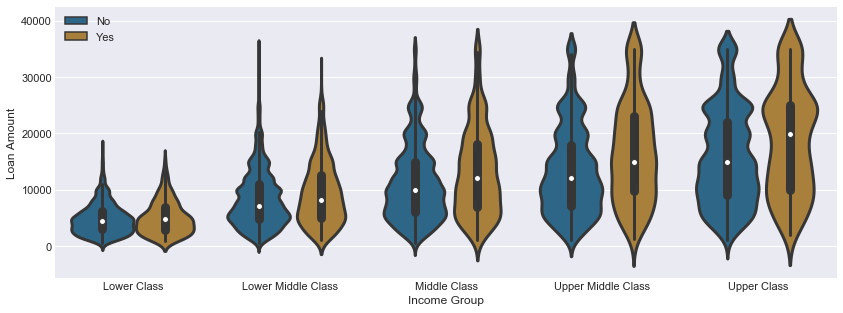

In [103]:
plt.figure(figsize=[14,5])
sns.violinplot(x=df.annual_inc_range,y=df.loan_amnt,hue=df.Defaulted,palette = sns.color_palette("colorblind",4),saturation = 0.5, linewidth = 3)
plt.xlabel("Income Group")
plt.ylabel("Loan Amount")
plt.legend(loc='upper left')
plt.show()

### Observation:
* We can see from the plot clearly that Lower class income group borrower have taken lesser amount of loans and hence may default more as well as we can see with width of graph
* Upper class income group have defaulted around loan amounts 25000USD as well as 10000USD. 
* Middle class income group have defaulted towards lesser amounts.
* Also most amount of loans are also fully paid on time by Upper class as there annual income is more

In [104]:
#annual_inc_range
inc_range_charge_off = pd.crosstab( df['annual_inc_range'],df['loan_status'],margins = True)
inc_range_charge_off['Probability_Charged Off'] = round((inc_range_charge_off['Charged Off']/inc_range_charge_off['All']),2)
# Removing last record as it contains 
inc_range_charge_off = inc_range_charge_off[0:-1]
inc_range_charge_off

loan_status,Charged Off,Fully Paid,All,Probability_Charged Off
annual_inc_range,,,,
Lower Class,419,1856,2275,0.18
Lower Middle Class,2018,10378,12396,0.16
Middle Class,1648,9810,11458,0.14
Upper Middle Class,724,5248,5972,0.12
Upper Class,547,4507,5054,0.11


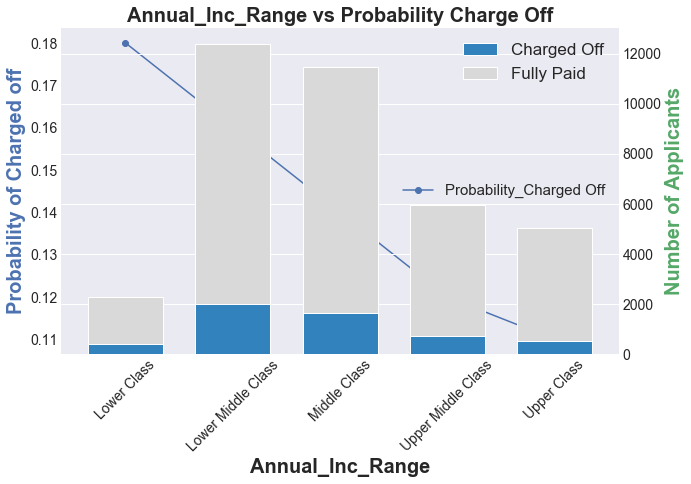

In [105]:
linePlot5 = inc_range_charge_off[['Probability_Charged Off']]      
barPlot5 =  inc_range_charge_off.iloc[:,0:2]
ax = linePlot5.plot(figsize=(10,6), marker='o',color = 'b')
ax2 = barPlot5.plot(kind='bar',ax = ax,rot=1,secondary_y=True,stacked=True,fontsize=14,colormap='tab20c',width =0.7)
ax.set_title(df['annual_inc_range'].name.title()+' vs Probability Charge Off',fontsize=20,weight="bold")
ax.set_xlabel(df['annual_inc_range'].name.title(),fontsize=20,weight="bold")
ax.set_ylabel('Probability of Charged off',color = 'b',fontsize=20,weight="bold")
ax2.set_ylabel('Number of Applicants',color = 'g',fontsize=20,weight="bold")

ax.tick_params(axis='x', rotation=45)
ax.legend(loc='center right',fontsize=15)
ax2.legend(loc='upper right',fontsize=17)
plt.show()

### Observations
As we can see that Probability of charge off is decreasing as income range increases.

## Home Ownership of Borrowers Analysis

In [106]:
df['home_ownership'].value_counts()

RENT        17992
MORTGAGE    16324
OWN          2740
OTHER          96
NONE            3
Name: home_ownership, dtype: int64

#### Remove None value in home ownership as its not implying anything

In [107]:
df = df[df.home_ownership.isin(['RENT','MORTGAGE','OWN','OTHER'])]

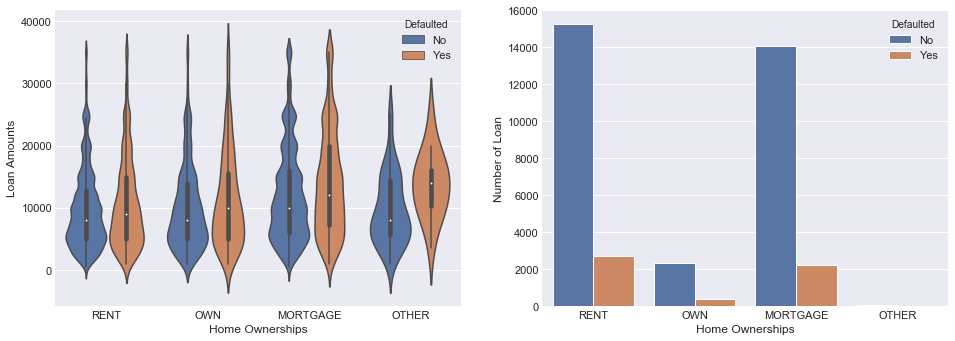

In [108]:
plt.figure(figsize=[16,12])
plt.subplot(2,2,1)

sns.violinplot(x=df.home_ownership,y=df.loan_amnt,hue=df.Defaulted)
plt.xlabel("Home Ownerships")
plt.ylabel("Loan Amounts")
plt.subplot(2,2,2)

sns.countplot(x=df.home_ownership,hue=df.Defaulted)
plt.xlabel("Home Ownerships")
plt.ylabel("Number of Loan")
plt.show()

### Observation
* As we can see above, there are 4 types of home ownership, ones staying on rent, ones having there own house with no loans taken on homes, ones having home but put on mortgage, and then there are others like ones staying in at someone else place may/may not be paying rent etc. 
* The borrowers who are staying on rent, have taken lower amounts of loan and also have defaulted more in lower range of loan amounts when compared to others. Also when comparing the number of loans they have taken the highest number of loans and also defaulted the most. But they have also fully paid the most number of loans
* The borrowers who have mortagaged there homes, have taken loan amounts with varied range of 5000 USD to 20000 USD.Also they have the 2nd highest number of defaulting loans.
* The Borrowers who have home ownership as others have defaulted on higher range of loan amounts. Hence when giving loans to these borrowers are risky as we dont know much about their assets and may result in higher amount loans defaulting. 
* Home owners have taken less number of loans and also higher amounts of loans. But the defaulting number of loans are the least. Hence they are the safest bet to give loans to.

## Employee Experience 

In [109]:
df.emp_experience.value_counts()

Entry-level     19155
Mid-level        9644
Senior-level     8353
Name: emp_experience, dtype: int64

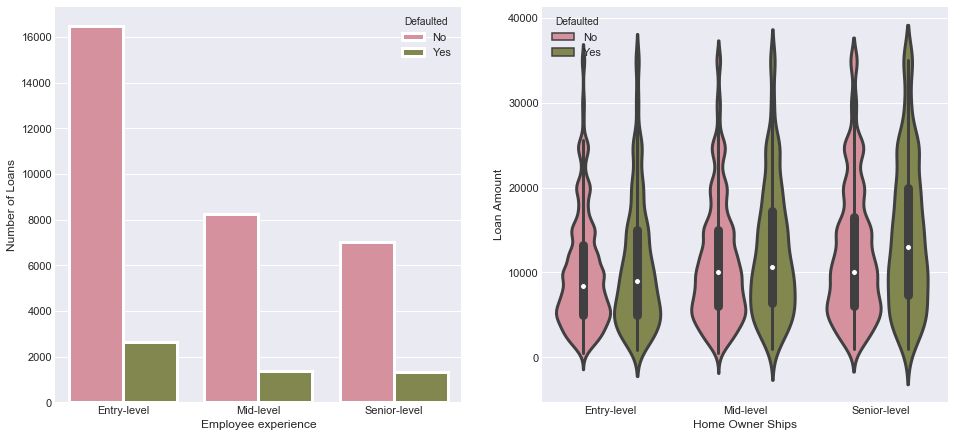

In [110]:
plt.figure(figsize=[16,16])
plt.subplot(2,2,1)
sns.countplot(x='emp_experience', hue='Defaulted',data=df,palette = sns.color_palette("husl",4),saturation = 0.5, linewidth = 3)
plt.xlabel("Employee experience")
plt.ylabel("Number of Loans")
plt.subplot(2,2,2)
sns.violinplot(data=df,x="emp_experience",y="loan_amnt",hue="Defaulted",palette = sns.color_palette("husl",4),saturation = 0.5, linewidth = 3)
sns.despine(left=True)
plt.xlabel("Home Owner Ships")
plt.ylabel("Loan Amount")
plt.show()

### Observations
* Entry Level employees(0-4 years of employee experience) are the ones who have defaulted the most number of loans as we can see in the bar plot above. But the they are the ones who have cleared the most number of loans. Hence giving out loans to less employee experience has more chances of defaulting. 
* Senior Level employees are the ones who have the least number of defaulting loans. Hence they are the safest opportunity to give loans to. 
* Mid Level Employee have behaved very similar to Mid Level Employees, hence even they can be considered to give loans with lesser risk

#### Probability of Charge off vs Employee exeperience

In [111]:
#annual_inc_range
Emp_exp_charge_off = pd.crosstab( df['emp_experience'],df['loan_status'],margins = True)
Emp_exp_charge_off['Probability_Charged Off'] = round((Emp_exp_charge_off['Charged Off']/Emp_exp_charge_off['All']),2)

Emp_exp_charge_off = Emp_exp_charge_off[0:-1]
Emp_exp_charge_off[["Probability_Charged Off"]]


loan_status,Probability_Charged Off
emp_experience,
Entry-level,0.14
Mid-level,0.14
Senior-level,0.16


In [112]:
df.head()

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,total_acc,total_pymnt,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,issue_month,term,grade,sub_grade,emp_length,home_ownership,verification_status,loan_status,purpose,title,addr_state,earliest_cr_line,issue_d,issue_month,issue_year,Defaulted,Defaulted_num,loan_amnt_range,emp_experience,annual_inc_range,int_rate_range,State
0,5000,5000,4975.00,10.65,24000.00,27.65,0,1,3,0,13648,9,5863.16,863.16,0.00,0.00,0.00,171.62,Dec,36 months,B,B2,10,RENT,Verified,Fully Paid,credit_card,Computer,AZ,Jan-85,Dec-11,Dec,11,No,0,0-5000,Senior-level,Lower Class,10-12.5,Arizona
1,2500,2500,2500.00,15.27,30000.00,1.00,0,5,3,0,1687,4,1008.71,435.17,0.00,117.08,1.11,119.66,Dec,60 months,C,C4,1,RENT,Source Verified,Charged Off,car,bike,GA,Apr-99,Dec-11,Dec,11,Yes,1,0-5000,Entry-level,Lower Middle Class,15 and above,Georgia
2,2400,2400,2400.00,15.96,12252.00,8.72,0,2,2,0,2956,10,3005.67,605.67,0.00,0.00,0.00,649.91,Dec,36 months,C,C5,10,RENT,Not Verified,Fully Paid,small_business,real estate business,IL,Nov-01,Dec-11,Dec,11,No,0,0-5000,Senior-level,Lower Class,15 and above,Illinois
3,10000,10000,10000.00,13.49,49200.00,20.00,0,1,10,0,5598,37,12231.89,2214.92,16.97,0.00,0.00,357.48,Dec,36 months,C,C1,10,RENT,Source Verified,Fully Paid,other,personel,CA,Feb-96,Dec-11,Dec,11,No,0,5000-10000,Senior-level,Lower Middle Class,12.5-15,California
4,5000,5000,5000.00,7.90,36000.00,11.20,0,3,9,0,7963,12,5632.21,632.21,0.00,0.00,0.00,161.03,Dec,36 months,A,A4,3,RENT,Source Verified,Fully Paid,wedding,My wedding loan I promise to pay back,AZ,Nov-04,Dec-11,Dec,11,No,0,0-5000,Entry-level,Lower Middle Class,7.5-10,Arizona


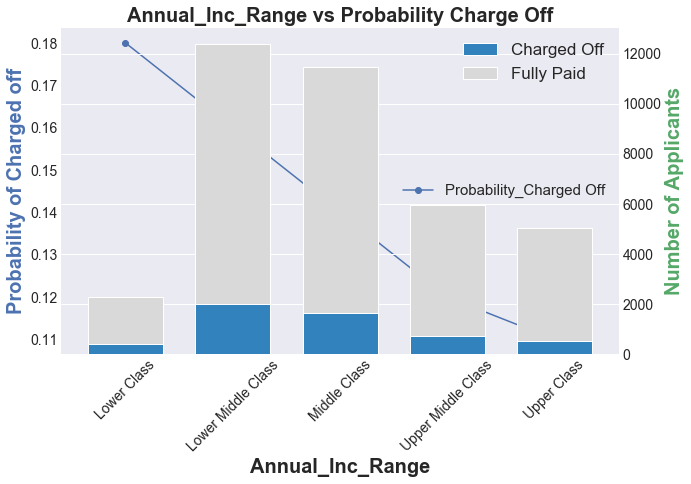

In [113]:
linePlot10 = inc_range_charge_off[['Probability_Charged Off']]      
barPlot10 =  inc_range_charge_off.iloc[:,0:2]
ax = linePlot10.plot(figsize=(10,6), marker='o',color = 'b')
ax2 = barPlot10.plot(kind='bar',ax = ax,rot=1,secondary_y=True,stacked=True,fontsize=14,colormap='tab20c',width =0.7)
ax.set_title(df['annual_inc_range'].name.title()+' vs Probability Charge Off',fontsize=20,weight="bold")
ax.set_xlabel(df['annual_inc_range'].name.title(),fontsize=20,weight="bold")
ax.set_ylabel('Probability of Charged off',color = 'b',fontsize=20,weight="bold")
ax2.set_ylabel('Number of Applicants',color = 'g',fontsize=20,weight="bold")

ax.tick_params(axis='x', rotation=45)
ax.legend(loc='center right',fontsize=15)
ax2.legend(loc='upper right',fontsize=17)
plt.show()

## What borrowers characteristics together lead to loan being defaulted or not ?
### Lets combine the above 3 paramaters and check what leads to loan being defaulted through parallel plots

In [114]:
# Create dimensions
income_dim = go.parcats.Dimension(
    values=df.annual_inc_range,
    categoryorder='category ascending', label="Class"
)

home_dim = go.parcats.Dimension(values=df.home_ownership, label="Home")
emp_dim = go.parcats.Dimension(values=df.emp_experience, label="Employee Exp")

default_dim = go.parcats.Dimension(
    values=df.Defaulted_num, label="Default", categoryarray=[0, 1],
    ticktext=['No', 'Yes']
)

# Create parcats trace
color = df.Defaulted_num;
colorscale = [[0, 'lightsteelblue'], [1, 'mediumseagreen']];

fig = go.Figure(data = [go.Parcats(dimensions=[income_dim, home_dim, emp_dim, default_dim],
        line={'color': color, 'colorscale': colorscale},
        hoveron='color', hoverinfo='count+probability',
        labelfont={'size': 18},
        tickfont={'size': 12},
        arrangement='freeform')])

fig.show()

### Observation:
* A loan taken by borrower in lower middle class, who is staying on rent, and has entry level experience in his job, is more likely to default a loan
* Also a loan by borrower in middle class , who is staying on rent, having entry level experience is more likely to default. 
* Also a loan taken by borrower , who has put his home on mortagage , has entry level experience is more likely to default. 
* There can be other combinations as well, but found top few combinations from the above graphs which can be used by lenders while giving loans